## Setup
- Clone repository
- install additional requirements


In [1]:
!git clone https://github.com/MaxSpeer/applied-computer-vision-assignment3.git
%cd applied-computer-vision-assignment3
!pip install -r requirements.txt
!pip install -e .


Cloning into 'applied-computer-vision-assignment3'...
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 9 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (9/9), 5.88 KiB | 5.88 MiB/s, done.
/content/applied-computer-vision-assignment3
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-2wv9tkvj
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-2wv9tkvj
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 141.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 90.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━

In [2]:
import clip
clip_model, clip_preprocess = clip.load("ViT-B/32")

100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 135MiB/s]


## Download trained U-Net

In [3]:
import torch
from huggingface_hub import hf_hub_download

from utils import UNet_utils, ddpm_utils

# TODO: Initialize the U-Net model and load the pre-trained weights from notebook 05.

# Make sure to use the same architecture as in the notebook.

repo_id = "maxspeer/cv_assignemt3_clip"
ckpt_path = hf_hub_download(force_download=True,
                            repo_id=repo_id, filename="ckpt_ep099.pt")  # cached locally

state = torch.load(ckpt_path, map_location="cpu")

if isinstance(state, dict) and "state_dict" in state:
    state = state["state_dict"]
elif isinstance(state, dict) and "model_state_dict" in state:
    state = state["model_state_dict"]


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet_utils.UNet(

    T=400, img_ch=3, img_size=32, down_chs=(256, 256, 512), t_embed_dim=8, c_embed_dim=512

).to(device)

model.load_state_dict(state) # You need to provide the path to your trained model

model.eval()

ckpt_ep099.pt:   0%|          | 0.00/539M [00:00<?, ?B/s]

UNet(
  (down0): ResidualConvBlock(
    (conv1): GELUConvBlock(
      (model): Sequential(
        (0): Conv2d(3, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(8, 256, eps=1e-05, affine=True)
        (2): GELU(approximate='none')
      )
    )
    (conv2): GELUConvBlock(
      (model): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(8, 256, eps=1e-05, affine=True)
        (2): GELU(approximate='none')
      )
    )
  )
  (down1): DownBlock(
    (model): Sequential(
      (0): GELUConvBlock(
        (model): Sequential(
          (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): GroupNorm(32, 256, eps=1e-05, affine=True)
          (2): GELU(approximate='none')
        )
      )
      (1): GELUConvBlock(
        (model): Sequential(
          (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): GroupNorm(32, 256, eps

In [4]:

# Extended list of prompts
text_prompts = [
    "A photo of a white daisy",
    "A photo of a pink tulip",
    "A photo of a purple lavender sprig",
    "A photo of an orange marigold",
    "A photo of a blue hydrangea cluster",
    "A photo of a white lily",
    "A photo of a red poppy",
    "A photo of a pale peony bloom",
    "A photo of a magenta orchid",
    "A photo of a bunch of pink cherry blossoms",
    "A photo of a field of purple wildflowers",
]
# Repeat queries to increase number of samples
text_prompts = [p for p in text_prompts for _ in range(10)]


In [5]:
# Delete privous generated images
# !rm -fR ./generated_images/*

In [5]:
T = 400
B_start = 0.0001
B_end = 0.02
B = torch.linspace(B_start, B_end, T).to(device)

ddpm = ddpm_utils.DDPM(B, device)

print("Num params: ", sum(p.numel() for p in model.parameters()))
model_flowers = torch.compile(model.to(device))

Num params:  44900355


In [6]:
IMG_SIZE = 32 # Due to stride and pooling, must be divisible by 2 multiple times
IMG_CH = 3
BATCH_SIZE = 128
INPUT_SIZE = (IMG_CH, IMG_SIZE, IMG_SIZE)

In [7]:
w = 2.0
def sample_flowers(text_list):
    text_tokens = clip.tokenize(text_list).to(device)
    c = clip_model.encode_text(text_tokens).float()
    x_gen, x_gen_store = ddpm_utils.sample_w(model, ddpm, INPUT_SIZE, T, c,
                                             device, w_tests=[w])
    return x_gen, x_gen_store

In [8]:
# --- Embedding Extraction using Hooks ---

# We will use PyTorch hooks to extract the output of the 'down2' layer (the bottleneck).
embeddings_storage = {}

def get_embedding_hook(name):

    def hook(model, input, output):
      """Hook function to capture layer outputs"""
      # Flatten the output if it's from conv layers
      if len(output.shape) > 2:
          embeddings_storage[name] = output.view(output.size(0), -1).cpu().detach()
      else:
          embeddings_storage[name] = output.cpu().detach()
      # embeddings_storage[name] = output.detach()

    return hook

handle = model.down2.register_forward_hook(get_embedding_hook('down2'))

generated_images, _ = sample_flowers(text_prompts)

extracted_embeddings = embeddings_storage['down2']
print(f"Empedding Shape: {extracted_embeddings[0].shape}")
print(f"Number of extracted embeddings: {len(extracted_embeddings)}")

Empedding Shape: torch.Size([32768])
Number of extracted embeddings: 320


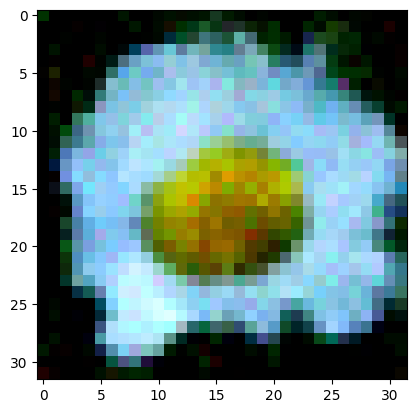

In [9]:
from torchvision.utils import make_grid
from utils.other_utils import show_tensor_image, to_image
import matplotlib.pyplot as plt
from PIL import Image

model.eval()
#grid = make_grid(generated_images.cpu(), nrow=len(text_prompts))
#show_tensor_image([grid])
#plt.show()

# Display the first generated image
show_tensor_image([generated_images[1]])
plt.show()

In [ ]:
#!pwd
#!rm -f ./generated_images/generated_*

## Saving the generated images

In [10]:
import os

out_dir = "./generated_images"
os.makedirs(out_dir, exist_ok=True)

for prompt in range(len(text_prompts)):
    os.makedirs(os.path.join(out_dir, f"prompt_{prompt}"), exist_ok=True)

for i in range(len(generated_images)):
    prompt_number = i % len(text_prompts)
    image_number = i // len(text_prompts)
    image = generated_images[i]
    out_subfolder = os.path.join(out_dir, f"prompt_{prompt_number}")
    to_image(image).save(
        os.path.join(out_subfolder, f"generated_image_{prompt_number}_{image_number}.png")
    )
print(f"Image files saved in {out_dir}")

Image files saved in ./generated_images


## Calculting scores
We use the calculate_clip_score function as provided.

In [11]:
import torch
import open_clip
from PIL import Image

def calculate_clip_score(image_path, text_prompt):
    # Load model
    model, _, preprocess = open_clip.create_model_and_transforms('ViT-B-32', pretrained='laion2b_s34b_b79k')

    # Preprocess inputs
    image = preprocess(Image.open(image_path)).unsqueeze(0)
    tokenizer = open_clip.get_tokenizer('ViT-B-32')
    text = tokenizer([text_prompt])

    # Compute features and similarity
    with torch.no_grad():
        image_features = model.encode_image(image)
        text_features = model.encode_text(text)

        # Normalize features
        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)

        # Calculate dot product
        score = (image_features @ text_features.T).item()
    return score

To calculate the FID score, we load the original **cropped** flower dataset.

In [12]:
from huggingface_hub import snapshot_download

# TODO: Initialize the U-Net model and load the pre-trained weights from notebook 05.

# Make sure to use the same architecture as in the notebook.

repo_id = "maxspeer/cropped_flowers"
target_dir = "./cropped_flowers"    # <-- dein Ordner in Colab
snapshot_download(force_download=True,
                repo_id=repo_id,
                repo_type="dataset",
                local_dir=target_dir,
                  )


Fetching 1169 files:   0%|          | 0/1169 [00:00<?, ?it/s]

.gitattributes: 0.00B [00:00, ?B/s]

README.txt:   0%|          | 0.00/339 [00:00<?, ?B/s]

LICENSE.txt: 0.00B [00:00, ?B/s]

daisy/10172636503_21bededa75_n.jpg:   0%|          | 0.00/2.09k [00:00<?, ?B/s]

daisy/102841525_bd6628ae3c.jpg:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

daisy/10172567486_2748826a8b.jpg:   0%|          | 0.00/8.85k [00:00<?, ?B/s]

daisy/10140303196_b88d3d6cec.jpg:   0%|          | 0.00/117k [00:00<?, ?B/s]

daisy/100080576_f52e8ee070_n.jpg:   0%|          | 0.00/26.8k [00:00<?, ?B/s]

daisy/1031799732_e7f4008c03.jpg:   0%|          | 0.00/45.9k [00:00<?, ?B/s]

daisy/10437929963_bc13eebe0c.jpg:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

daisy/10437754174_22ec990b77_m.jpg:   0%|          | 0.00/5.67k [00:00<?, ?B/s]

daisy/10466290366_cc72e33532.jpg:   0%|          | 0.00/6.29k [00:00<?, ?B/s]

daisy/10559679065_50d2b16f6d.jpg:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

daisy/10466558316_a7198b87e2.jpg:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

daisy/105806915_a9c13e2106_n.jpg:   0%|          | 0.00/2.84k [00:00<?, ?B/s]

daisy/10712722853_5632165b04.jpg:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

daisy/107592979_aaa9cdfe78_m.jpg:   0%|          | 0.00/31.7k [00:00<?, ?B/s]

daisy/10770585085_4742b9dac3_n.jpg:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

daisy/10841136265_af473efc60.jpg:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

daisy/10993818044_4c19b86c82.jpg:   0%|          | 0.00/5.39k [00:00<?, ?B/s]

daisy/10993710036_2033222c91.jpg:   0%|          | 0.00/8.44k [00:00<?, ?B/s]

daisy/10994032453_ac7f8d9e2e.jpg:   0%|          | 0.00/6.21k [00:00<?, ?B/s]

daisy/11023214096_b5b39fab08.jpg:   0%|          | 0.00/77.5k [00:00<?, ?B/s]

daisy/11023272144_fce94401f2_m.jpg:   0%|          | 0.00/17.3k [00:00<?, ?B/s]

daisy/11023277956_8980d53169_m.jpg:   0%|          | 0.00/22.0k [00:00<?, ?B/s]

daisy/11124324295_503f3a0804.jpg:   0%|          | 0.00/6.76k [00:00<?, ?B/s]

daisy/1140299375_3aa7024466.jpg:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

daisy/11439894966_dca877f0cd.jpg:   0%|          | 0.00/8.81k [00:00<?, ?B/s]

daisy/1150395827_6f94a5c6e4_n.jpg:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

daisy/11642632_1e7627a2cc.jpg:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

daisy/11834945233_a53b7a92ac_m.jpg:   0%|          | 0.00/3.86k [00:00<?, ?B/s]

daisy/11870378973_2ec1919f12.jpg:   0%|          | 0.00/1.61k [00:00<?, ?B/s]

daisy/12193032636_b50ae7db35_n.jpg:   0%|          | 0.00/36.2k [00:00<?, ?B/s]

daisy/11891885265_ccefec7284_n.jpg:   0%|          | 0.00/3.07k [00:00<?, ?B/s]

daisy/12348343085_d4c396e5b5_m.jpg:   0%|          | 0.00/22.0k [00:00<?, ?B/s]

daisy/1265350143_6e2b276ec9.jpg:   0%|          | 0.00/35.6k [00:00<?, ?B/s]

daisy/12585131704_0f64b17059_m.jpg:   0%|          | 0.00/9.98k [00:00<?, ?B/s]

daisy/12701063955_4840594ea6_n.jpg:   0%|          | 0.00/1.63k [00:00<?, ?B/s]

daisy/1285423653_18926dc2c8_n.jpg:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

daisy/1286274236_1d7ac84efb_n.jpg:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

daisy/12601254324_3cb62c254a_m.jpg:   0%|          | 0.00/1.69k [00:00<?, ?B/s]

daisy/1299501272_59d9da5510_n.jpg:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

daisy/1314069875_da8dc023c6_m.jpg:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

daisy/1342002397_9503c97b49.jpg:   0%|          | 0.00/99.4k [00:00<?, ?B/s]

daisy/134409839_71069a95d1_m.jpg:   0%|          | 0.00/31.4k [00:00<?, ?B/s]

daisy/1344985627_c3115e2d71_n.jpg:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

daisy/13491959645_2cd9df44d6_n.jpg:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

daisy/13583238844_573df2de8e_m.jpg:   0%|          | 0.00/1.28k [00:00<?, ?B/s]

daisy/1354396826_2868631432_m.jpg:   0%|          | 0.00/7.90k [00:00<?, ?B/s]

daisy/1374193928_a52320eafa.jpg:   0%|          | 0.00/103k [00:00<?, ?B/s]

daisy/13826249325_f61cb15f86_n.jpg:   0%|          | 0.00/8.38k [00:00<?, ?B/s]

daisy/13901930939_a7733c03f0_n.jpg:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

daisy/1392131677_116ec04751.jpg:   0%|          | 0.00/28.5k [00:00<?, ?B/s]

daisy/1392946544_115acbb2d9.jpg:   0%|          | 0.00/136k [00:00<?, ?B/s]

daisy/13953307149_f8de6a768c_m.jpg:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

daisy/13977181862_f8237b6b52.jpg:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

daisy/14021430525_e06baf93a9.jpg:   0%|          | 0.00/5.16k [00:00<?, ?B/s]

daisy/14073784469_ffb12f3387_n.jpg:   0%|          | 0.00/24.7k [00:00<?, ?B/s]

daisy/14114116486_0bb6649bc1_m.jpg:   0%|          | 0.00/2.03k [00:00<?, ?B/s]

daisy/14167534527_781ceb1b7a_n.jpg:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

daisy/14147016029_8d3cf2414e.jpg:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

daisy/14167543177_cd36b54ac6_n.jpg:   0%|          | 0.00/30.6k [00:00<?, ?B/s]

daisy/14219214466_3ca6104eae_m.jpg:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

daisy/14221836990_90374e6b34.jpg:   0%|          | 0.00/4.50k [00:00<?, ?B/s]

daisy/14221848160_7f0a37c395.jpg:   0%|          | 0.00/1.94k [00:00<?, ?B/s]

daisy/14264136211_9531fbc144.jpg:   0%|          | 0.00/3.08k [00:00<?, ?B/s]

daisy/14245834619_153624f836.jpg:   0%|          | 0.00/5.07k [00:00<?, ?B/s]

daisy/14272874304_47c0a46f5a.jpg:   0%|          | 0.00/23.5k [00:00<?, ?B/s]

daisy/14307766919_fac3c37a6b_m.jpg:   0%|          | 0.00/6.73k [00:00<?, ?B/s]

daisy/14332947164_9b13513c71_m.jpg:   0%|          | 0.00/3.05k [00:00<?, ?B/s]

daisy/14350958832_29bdd3a254.jpg:   0%|          | 0.00/6.79k [00:00<?, ?B/s]

daisy/14333681205_a07c9f1752_m.jpg:   0%|          | 0.00/4.29k [00:00<?, ?B/s]

daisy/14330343061_99478302d4_m.jpg:   0%|          | 0.00/9.56k [00:00<?, ?B/s]

daisy/14354051035_1037b30421_n.jpg:   0%|          | 0.00/35.9k [00:00<?, ?B/s]

daisy/14372713423_61e2daae88.jpg:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

daisy/14399435971_ea5868c792.jpg:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

daisy/144076848_57e1d662e3_m.jpg:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

daisy/1441939151_b271408c8d_n.jpg:   0%|          | 0.00/7.21k [00:00<?, ?B/s]

daisy/144603918_b9de002f60_m.jpg:   0%|          | 0.00/9.90k [00:00<?, ?B/s]

daisy/14485782498_fb342ec301.jpg:   0%|          | 0.00/3.21k [00:00<?, ?B/s]

daisy/14471433500_cdaa22e3ea_m.jpg:   0%|          | 0.00/6.46k [00:00<?, ?B/s]

daisy/14551098743_2842e7a004_n.jpg:   0%|          | 0.00/2.87k [00:00<?, ?B/s]

daisy/14507818175_05219b051c_m.jpg:   0%|          | 0.00/6.49k [00:00<?, ?B/s]

daisy/14554906452_35f066ffe9_n.jpg:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

daisy/14591326135_930703dbed_m.jpg:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

daisy/14600779226_7bbc288d40_m.jpg:   0%|          | 0.00/2.85k [00:00<?, ?B/s]

daisy/14613443462_d4ed356201.jpg:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

daisy/14698531521_0c2f0c6539.jpg:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

daisy/147068564_32bb4350cc.jpg:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

daisy/14707111433_cce08ee007.jpg:   0%|          | 0.00/79.8k [00:00<?, ?B/s]

daisy/14716799982_ed6d626a66.jpg:   0%|          | 0.00/31.5k [00:00<?, ?B/s]

daisy/14816364517_2423021484_m.jpg:   0%|          | 0.00/6.67k [00:00<?, ?B/s]

daisy/14921511479_7b0a647795.jpg:   0%|          | 0.00/5.00k [00:00<?, ?B/s]

daisy/14866200659_6462c723cb_m.jpg:   0%|          | 0.00/5.61k [00:00<?, ?B/s]

daisy/15029936576_8d6f96c72c_n.jpg:   0%|          | 0.00/26.8k [00:00<?, ?B/s]

daisy/15207766_fc2f1d692c_n.jpg:   0%|          | 0.00/26.2k [00:00<?, ?B/s]

daisy/15306268004_4680ba95e1.jpg:   0%|          | 0.00/7.20k [00:00<?, ?B/s]

daisy/153210866_03cc9f2f36.jpg:   0%|          | 0.00/45.3k [00:00<?, ?B/s]

daisy/15327813273_06cdf42210.jpg:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

daisy/15760153042_a2a90e9da5_m.jpg:   0%|          | 0.00/1.59k [00:00<?, ?B/s]

daisy/15853110333_229c439e7f.jpg:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

daisy/158869618_f1a6704236_n.jpg:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

daisy/16025261368_911703a536_n.jpg:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

daisy/16121105382_b96251e506_m.jpg:   0%|          | 0.00/3.52k [00:00<?, ?B/s]

daisy/162362896_99c7d851c8_n.jpg:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

daisy/16161045294_70c76ce846_n.jpg:   0%|          | 0.00/7.75k [00:00<?, ?B/s]

daisy/162362897_1d21b70621_m.jpg:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

daisy/16291797949_a1b1b7c2bd_n.jpg:   0%|          | 0.00/23.6k [00:00<?, ?B/s]

daisy/16360180712_b72695928c_n.jpg:   0%|          | 0.00/8.02k [00:00<?, ?B/s]

daisy/163978992_8128b49d3e_n.jpg:   0%|          | 0.00/31.8k [00:00<?, ?B/s]

daisy/16401288243_36112bd52f_m.jpg:   0%|          | 0.00/4.67k [00:00<?, ?B/s]

daisy/16819071290_471d99e166_m.jpg:   0%|          | 0.00/6.13k [00:00<?, ?B/s]

daisy/16737503507_431768a927.jpg:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

daisy/16833748795_b681b2839f_n.jpg:   0%|          | 0.00/2.15k [00:00<?, ?B/s]

daisy/169371301_d9b91a2a42.jpg:   0%|          | 0.00/4.83k [00:00<?, ?B/s]

daisy/17027891179_3edc08f4f6.jpg:   0%|          | 0.00/55.8k [00:00<?, ?B/s]

daisy/171972704_389cf7a953.jpg:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

daisy/17249393016_093e915012_n.jpg:   0%|          | 0.00/50.8k [00:00<?, ?B/s]

daisy/172882635_4cc7b86731_m.jpg:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

daisy/172967318_c596d082cc.jpg:   0%|          | 0.00/8.28k [00:00<?, ?B/s]

daisy/174131220_c853df1287.jpg:   0%|          | 0.00/5.74k [00:00<?, ?B/s]

daisy/175106495_53ebdef092_n.jpg:   0%|          | 0.00/8.97k [00:00<?, ?B/s]

daisy/176375506_201859bb92_m.jpg:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

daisy/18023717391_e2c9089e10.jpg:   0%|          | 0.00/7.26k [00:00<?, ?B/s]

daisy/18195689904_46619b7e16_n.jpg:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

daisy/18400014056_2e4c601ed5.jpg:   0%|          | 0.00/3.50k [00:00<?, ?B/s]

daisy/18684594849_7dd3634f5e_n.jpg:   0%|          | 0.00/3.29k [00:00<?, ?B/s]

daisy/18622672908_eab6dc9140_n.jpg:   0%|          | 0.00/8.10k [00:00<?, ?B/s]

daisy/18711159980_11d3bd5042.jpg:   0%|          | 0.00/23.7k [00:00<?, ?B/s]

daisy/1879567877_8ed2a5faa7_n.jpg:   0%|          | 0.00/6.68k [00:00<?, ?B/s]

daisy/18901817451_43e2b45f6c.jpg:   0%|          | 0.00/25.4k [00:00<?, ?B/s]

daisy/19178753159_a471bf4b6b.jpg:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

daisy/19280272025_57de24e940_m.jpg:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

daisy/19544831049_0d738d4872_m.jpg:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

daisy/1955336401_fbb206d6ef_n.jpg:   0%|          | 0.00/31.6k [00:00<?, ?B/s]

daisy/19813618946_93818db7aa_m.jpg:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

daisy/2001380507_19488ff96a_n.jpg:   0%|          | 0.00/38.5k [00:00<?, ?B/s]

daisy/2019064575_7656b9340f_m.jpg:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

daisy/2045022175_ad087f5f60_n.jpg:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

daisy/2057816617_18448093d0_n.jpg:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

daisy/20685027271_0e7306e7c1_n.jpg:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

daisy/20703737132_179560d0fb.jpg:   0%|          | 0.00/28.3k [00:00<?, ?B/s]

daisy/20773528301_008fcbc5a1_n.jpg:   0%|          | 0.00/3.22k [00:00<?, ?B/s]

daisy/2077865117_9ed85191ae_n.jpg:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

daisy/2087343668_ef4fb95787_n.jpg:   0%|          | 0.00/31.6k [00:00<?, ?B/s]

daisy/21652746_cc379e0eea_m.jpg:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

daisy/21626652132_97e1318bb8_m.jpg:   0%|          | 0.00/2.77k [00:00<?, ?B/s]

daisy/21805938544_bf6bb0e4bc.jpg:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

daisy/2213954589_c7da4b1486.jpg:   0%|          | 0.00/50.5k [00:00<?, ?B/s]

daisy/22244161124_53e457bb66_n.jpg:   0%|          | 0.00/4.50k [00:00<?, ?B/s]

daisy/2331133004_582772d58f_m.jpg:   0%|          | 0.00/8.22k [00:00<?, ?B/s]

daisy/2346726545_2ebce2b2a6.jpg:   0%|          | 0.00/30.3k [00:00<?, ?B/s]

daisy/2365428551_39f83f10bf_n.jpg:   0%|          | 0.00/34.1k [00:00<?, ?B/s]

daisy/2454280135_ac3aa75cdc_n.jpg:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

daisy/2408024540_37f0be7cc0_n.jpg:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

daisy/2454280137_e1637536ae_n.jpg:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

daisy/2473825306_62fd5f8785_n.jpg:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

daisy/2476937534_21b285aa46_n.jpg:   0%|          | 0.00/7.95k [00:00<?, ?B/s]

daisy/2480569557_f4e1f0dcb8_n.jpg:   0%|          | 0.00/3.69k [00:00<?, ?B/s]

daisy/2488902131_3417698611_n.jpg:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

daisy/2498632196_e47a472d5a.jpg:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

daisy/2509545845_99e79cb8a2_n.jpg:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

daisy/2511306240_9047015f2d_n.jpg:   0%|          | 0.00/5.64k [00:00<?, ?B/s]

daisy/2514748602_343d4727c0_n.jpg:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

daisy/2521408074_e6f86daf21_n.jpg:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

daisy/25360380_1a881a5648.jpg:   0%|          | 0.00/18.3k [00:00<?, ?B/s]

daisy/2536529152_33ef3ee078_n.jpg:   0%|          | 0.00/8.03k [00:00<?, ?B/s]

daisy/2538504987_fe524b92a8_n.jpg:   0%|          | 0.00/4.38k [00:00<?, ?B/s]

daisy/2539552964_921cf645ba_n.jpg:   0%|          | 0.00/5.36k [00:00<?, ?B/s]

daisy/2551708158_1f10e81e11.jpg:   0%|          | 0.00/5.79k [00:00<?, ?B/s]

daisy/2556503265_63ae6b9e0e_m.jpg:   0%|          | 0.00/7.04k [00:00<?, ?B/s]

daisy/2561352120_7961d8263f.jpg:   0%|          | 0.00/110k [00:00<?, ?B/s]

daisy/2573240560_ff7ffdd449.jpg:   0%|          | 0.00/60.8k [00:00<?, ?B/s]

daisy/2579018590_74359dcf1a_m.jpg:   0%|          | 0.00/5.26k [00:00<?, ?B/s]

daisy/2590291468_2635d3e4e0_n.jpg:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

daisy/2599662355_7782218c83.jpg:   0%|          | 0.00/32.0k [00:00<?, ?B/s]

daisy/2619413565_61a6cd3ac9_m.jpg:   0%|          | 0.00/8.12k [00:00<?, ?B/s]

daisy/2612704455_efce1c2144_m.jpg:   0%|          | 0.00/6.98k [00:00<?, ?B/s]

daisy/2621723097_736febb4a4_n.jpg:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

daisy/2627815904_919373e7f5.jpg:   0%|          | 0.00/3.78k [00:00<?, ?B/s]

daisy/2632216904_274aa17433.jpg:   0%|          | 0.00/24.1k [00:00<?, ?B/s]

daisy/2642408410_61545fdc83_n.jpg:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

daisy/2646438199_b309cffd65_n.jpg:   0%|          | 0.00/4.28k [00:00<?, ?B/s]

daisy/2649404904_b7a91991bb_n.jpg:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

daisy/267148092_4bb874af58.jpg:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

daisy/2666572212_2caca8de9f_n.jpg:   0%|          | 0.00/2.41k [00:00<?, ?B/s]

daisy/2713919471_301fcc941f.jpg:   0%|          | 0.00/23.2k [00:00<?, ?B/s]

daisy/2812442552_3eed5fb9f2_m.jpg:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

daisy/2838487505_6c3b48efa5_m.jpg:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

daisy/2862944799_45bc8e7302.jpg:   0%|          | 0.00/4.97k [00:00<?, ?B/s]

daisy/286875003_f7c0e1882d.jpg:   0%|          | 0.00/37.6k [00:00<?, ?B/s]

daisy/2877860110_a842f8b14a_m.jpg:   0%|          | 0.00/22.5k [00:00<?, ?B/s]

daisy/2901376034_cdb4bac26b_m.jpg:   0%|          | 0.00/8.18k [00:00<?, ?B/s]

daisy/294451721_5106537b34.jpg:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

daisy/2908212142_5437fa67ff_n.jpg:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

daisy/299129811_d6ebda9970.jpg:   0%|          | 0.00/45.5k [00:00<?, ?B/s]

daisy/301964511_fab84ea1c1.jpg:   0%|          | 0.00/81.2k [00:00<?, ?B/s]

daisy/3025866885_22fb0b61c6_n.jpg:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

daisy/302782756_d35cb3e468.jpg:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

daisy/305160642_53cde0f44f.jpg:   0%|          | 0.00/44.2k [00:00<?, ?B/s]

daisy/3080880039_4f1bd592e5_n.jpg:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

daisy/3275951182_d27921af97_n.jpg:   0%|          | 0.00/36.0k [00:00<?, ?B/s]

daisy/3310644753_5607eb96a4_m.jpg:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

daisy/3326037909_b5ae370722_n.jpg:   0%|          | 0.00/6.21k [00:00<?, ?B/s]

daisy/3336704121_cfeb67a7d7.jpg:   0%|          | 0.00/4.26k [00:00<?, ?B/s]

daisy/3337536080_1db19964fe.jpg:   0%|          | 0.00/4.92k [00:00<?, ?B/s]

daisy/3338077096_3a8ed0e2bc_m.jpg:   0%|          | 0.00/4.83k [00:00<?, ?B/s]

daisy/3356112863_75da8bca2c_m.jpg:   0%|          | 0.00/8.19k [00:00<?, ?B/s]

daisy/3379332157_04724f6480.jpg:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

daisy/3386988684_bc5a66005e.jpg:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

daisy/3410906335_37e8a24b1c_n.jpg:   0%|          | 0.00/7.56k [00:00<?, ?B/s]

daisy/3415180846_d7b5cced14_m.jpg:   0%|          | 0.00/2.22k [00:00<?, ?B/s]

daisy/3440366251_5b9bdf27c9_m.jpg:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

daisy/3445110406_0c1616d2e3_n.jpg:   0%|          | 0.00/4.92k [00:00<?, ?B/s]

daisy/3450822975_7e77d67636_n.jpg:   0%|          | 0.00/8.19k [00:00<?, ?B/s]

daisy/3456403987_5bd5fa6ece_n.jpg:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

daisy/3463313493_9497aa47e5_n.jpg:   0%|          | 0.00/9.46k [00:00<?, ?B/s]

daisy/3474942718_c418dae6f1.jpg:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

daisy/3468498624_d082f99e98.jpg:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

daisy/3483303007_42e3f90da7.jpg:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

daisy/3491933306_43cfe2cfbe.jpg:   0%|          | 0.00/2.75k [00:00<?, ?B/s]

daisy/3506866918_61dd5fc53b_n.jpg:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

daisy/3533954656_79156c8473.jpg:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

daisy/3625257860_33efeef614_m.jpg:   0%|          | 0.00/8.70k [00:00<?, ?B/s]

daisy/3628485766_4ff937954a_n.jpg:   0%|          | 0.00/3.40k [00:00<?, ?B/s]

daisy/3633489595_a037a9b7a4_m.jpg:   0%|          | 0.00/5.46k [00:00<?, ?B/s]

daisy/3640845041_80a92c4205_n.jpg:   0%|          | 0.00/14.2k [00:00<?, ?B/s]

daisy/3639009391_0f910681b7.jpg:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

daisy/367020749_3c9a652d75.jpg:   0%|          | 0.00/107k [00:00<?, ?B/s]

daisy/3637428148_a1dcccafa9_n.jpg:   0%|          | 0.00/7.74k [00:00<?, ?B/s]

daisy/3661613900_b15ca1d35d_m.jpg:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

daisy/3695826945_9f374e8a00_m.jpg:   0%|          | 0.00/7.07k [00:00<?, ?B/s]

daisy/3699235066_fc09a02dfe_m.jpg:   0%|          | 0.00/9.92k [00:00<?, ?B/s]

daisy/3706420943_66f3214862_n.jpg:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

daisy/3713290261_8a66de23ab.jpg:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

daisy/3717746329_53f515c6a6_m.jpg:   0%|          | 0.00/8.85k [00:00<?, ?B/s]

daisy/3750250718_eb61146c5f.jpg:   0%|          | 0.00/3.71k [00:00<?, ?B/s]

daisy/3711723108_65247a3170.jpg:   0%|          | 0.00/30.0k [00:00<?, ?B/s]

daisy/3750771898_cfd50090ba_n.jpg:   0%|          | 0.00/53.7k [00:00<?, ?B/s]

daisy/3758221664_b19116d61f.jpg:   0%|          | 0.00/89.2k [00:00<?, ?B/s]

daisy/3764116502_f394428ee0_n.jpg:   0%|          | 0.00/3.33k [00:00<?, ?B/s]

daisy/3780380240_ef9ec1b737_m.jpg:   0%|          | 0.00/4.90k [00:00<?, ?B/s]

daisy/3861452393_14d2f95157_m.jpg:   0%|          | 0.00/7.17k [00:00<?, ?B/s]

daisy/3957488431_52a447c0e8_m.jpg:   0%|          | 0.00/9.32k [00:00<?, ?B/s]

daisy/3962240986_0661edc43a_n.jpg:   0%|          | 0.00/4.50k [00:00<?, ?B/s]

daisy/3963330924_6c6a3fa7be_n.jpg:   0%|          | 0.00/9.13k [00:00<?, ?B/s]

daisy/4065883015_4bb6010cb7_n.jpg:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

daisy/4117918318_3c8935289b_m.jpg:   0%|          | 0.00/12.4k [00:00<?, ?B/s]

daisy/413815348_764ae83088.jpg:   0%|          | 0.00/37.6k [00:00<?, ?B/s]

daisy/4141147800_813f660b47.jpg:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

daisy/422094774_28acc69a8b_n.jpg:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

daisy/4229503616_9b8a42123c_n.jpg:   0%|          | 0.00/9.94k [00:00<?, ?B/s]

daisy/4276898893_609d11db8b.jpg:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

daisy/4278442064_a5a598524b_m.jpg:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

daisy/4281102584_c548a69b81_m.jpg:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

daisy/4286053334_a75541f20b_m.jpg:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

daisy/4318007511_e9f4311936_n.jpg:   0%|          | 0.00/3.33k [00:00<?, ?B/s]

daisy/4333085242_bbeb3e2841_m.jpg:   0%|          | 0.00/1.43k [00:00<?, ?B/s]

daisy/433837534_1dbf798b73.jpg:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

daisy/433037739_6a030e5912.jpg:   0%|          | 0.00/31.1k [00:00<?, ?B/s]

daisy/4434592930_6610d51fca_m.jpg:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

daisy/43474673_7bb4465a86.jpg:   0%|          | 0.00/84.6k [00:00<?, ?B/s]

daisy/437859108_173fb33c98.jpg:   0%|          | 0.00/91.0k [00:00<?, ?B/s]

daisy/4440480869_632ce6aff3_n.jpg:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

daisy/446484749_4044affcaf_n.jpg:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

daisy/450128527_fd35742d44.jpg:   0%|          | 0.00/31.9k [00:00<?, ?B/s]

daisy/4496202781_1d8e776ff5_n.jpg:   0%|          | 0.00/24.1k [00:00<?, ?B/s]

daisy/4538877108_3c793f7987_m.jpg:   0%|          | 0.00/9.71k [00:00<?, ?B/s]

daisy/4534460263_8e9611db3c_n.jpg:   0%|          | 0.00/6.72k [00:00<?, ?B/s]

daisy/4565255237_9ba29c4d4e_n.jpg:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

daisy/4598422221_b37313a3e3_n.jpg:   0%|          | 0.00/5.03k [00:00<?, ?B/s]

daisy/4581199679_867652c3f1_n.jpg:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

daisy/4613992315_143ccc2a10_m.jpg:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

daisy/4646886118_b5c5ceaf6d_n.jpg:   0%|          | 0.00/26.7k [00:00<?, ?B/s]

daisy/4666648087_b10f376f19.jpg:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

daisy/4657354814_f368762c53_m.jpg:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

daisy/4669117051_ce61e91b76.jpg:   0%|          | 0.00/5.72k [00:00<?, ?B/s]

daisy/4668543441_79040ca329_n.jpg:   0%|          | 0.00/27.0k [00:00<?, ?B/s]

daisy/4683997791_56e7d3c03c_n.jpg:   0%|          | 0.00/1.71k [00:00<?, ?B/s]

daisy/4694730335_2553e77aa5_z.jpg:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

daisy/4694734757_5c563d38dd_n.jpg:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

daisy/4724713781_d169f98a35.jpg:   0%|          | 0.00/21.7k [00:00<?, ?B/s]

daisy/476856232_7c35952f40_n.jpg:   0%|          | 0.00/3.70k [00:00<?, ?B/s]

daisy/4757448834_a29a9538c9_n.jpg:   0%|          | 0.00/4.34k [00:00<?, ?B/s]

daisy/476857510_d2b30175de_n.jpg:   0%|          | 0.00/6.05k [00:00<?, ?B/s]

daisy/4753134939_8e87649db6.jpg:   0%|          | 0.00/4.67k [00:00<?, ?B/s]

daisy/4814515275_6e25a6c18f.jpg:   0%|          | 0.00/34.2k [00:00<?, ?B/s]

daisy/4837182901_69a6cc782b_n.jpg:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

daisy/483886997_27ee798327.jpg:   0%|          | 0.00/4.14k [00:00<?, ?B/s]

daisy/4851353993_2cbbbd1040_n.jpg:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

daisy/4865691548_00319261b8.jpg:   0%|          | 0.00/3.65k [00:00<?, ?B/s]

daisy/488202750_c420cbce61.jpg:   0%|          | 0.00/45.3k [00:00<?, ?B/s]

daisy/4897587985_f9293ea1ed.jpg:   0%|          | 0.00/8.23k [00:00<?, ?B/s]

daisy/4993492878_11fd4f5d12.jpg:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

daisy/498159452_b71afd65ba.jpg:   0%|          | 0.00/30.0k [00:00<?, ?B/s]

daisy/5014137563_d03eb0ed75_n.jpg:   0%|          | 0.00/22.7k [00:00<?, ?B/s]

daisy/5054771689_00dd40b971_n.jpg:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

daisy/5058708968_8bdcd29e63_n.jpg:   0%|          | 0.00/5.39k [00:00<?, ?B/s]

daisy/506018088_4f7a15a7c5_n.jpg:   0%|          | 0.00/22.8k [00:00<?, ?B/s]

daisy/506348009_9ecff8b6ef.jpg:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

daisy/5109508979_68e3530791_m.jpg:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

daisy/510844526_858b8fe4db.jpg:   0%|          | 0.00/33.7k [00:00<?, ?B/s]

daisy/5110105726_53eb7a93be_m.jpg:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

daisy/5110107234_12ddc0206b_m.jpg:   0%|          | 0.00/6.14k [00:00<?, ?B/s]

daisy/5110109540_beed4ed162_m.jpg:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

daisy/5110110938_9da91455c4_m.jpg:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

daisy/512177035_70afc925c8.jpg:   0%|          | 0.00/39.7k [00:00<?, ?B/s]

daisy/5133243796_44de429de5_m.jpg:   0%|          | 0.00/8.01k [00:00<?, ?B/s]

daisy/521762040_f26f2e08dd.jpg:   0%|          | 0.00/27.2k [00:00<?, ?B/s]

daisy/520752848_4b87fb91a4.jpg:   0%|          | 0.00/73.7k [00:00<?, ?B/s]

daisy/5135131051_102d4878ca_n.jpg:   0%|          | 0.00/3.46k [00:00<?, ?B/s]

daisy/525780443_bba812c26a_m.jpg:   0%|          | 0.00/9.38k [00:00<?, ?B/s]

daisy/538920244_59899a78f8_n.jpg:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

daisy/5434742166_35773eba57_m.jpg:   0%|          | 0.00/6.32k [00:00<?, ?B/s]

daisy/534547364_3f6b7279d2_n.jpg:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

daisy/5434901893_4550be3f84_m.jpg:   0%|          | 0.00/2.37k [00:00<?, ?B/s]

daisy/5434913005_409c1e8b56_n.jpg:   0%|          | 0.00/7.74k [00:00<?, ?B/s]

daisy/5434914569_e9b982fde0_n.jpg:   0%|          | 0.00/4.77k [00:00<?, ?B/s]

daisy/5435513198_90ce39f1aa_n.jpg:   0%|          | 0.00/3.23k [00:00<?, ?B/s]

daisy/5435521200_92029bbe2b_n.jpg:   0%|          | 0.00/8.63k [00:00<?, ?B/s]

daisy/5435522104_1d6a61b431_n.jpg:   0%|          | 0.00/6.43k [00:00<?, ?B/s]

daisy/54377391_15648e8d18.jpg:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

daisy/5459481183_18d2d49e44_m.jpg:   0%|          | 0.00/9.14k [00:00<?, ?B/s]

daisy/5512287917_9f5d3f0f98_n.jpg:   0%|          | 0.00/9.91k [00:00<?, ?B/s]

daisy/5574421625_61b1f49b3f_m.jpg:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

daisy/5561775629_a2b709b3a4_n.jpg:   0%|          | 0.00/8.26k [00:00<?, ?B/s]

daisy/5602738326_97121e007d_n.jpg:   0%|          | 0.00/14.2k [00:00<?, ?B/s]

daisy/5623010186_796ca8d29a.jpg:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

daisy/5577555349_2e8490259b.jpg:   0%|          | 0.00/9.41k [00:00<?, ?B/s]

daisy/5626784099_b36dd3fb11_n.jpg:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

daisy/5673551_01d1ea993e_n.jpg:   0%|          | 0.00/35.5k [00:00<?, ?B/s]

daisy/5626895440_97a0ec04c2_n.jpg:   0%|          | 0.00/37.2k [00:00<?, ?B/s]

daisy/5673728_71b8cb57eb.jpg:   0%|          | 0.00/30.2k [00:00<?, ?B/s]

daisy/5679288570_b4c52e76d5.jpg:   0%|          | 0.00/3.50k [00:00<?, ?B/s]

daisy/5632774792_0fa33d17eb_n.jpg:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

daisy/5684911529_88a7ae32ba_n.jpg:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

daisy/5693459303_e61d9a9533.jpg:   0%|          | 0.00/1.58k [00:00<?, ?B/s]

daisy/5700781400_65761f3fce.jpg:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

daisy/5714327423_50af0cffe9.jpg:   0%|          | 0.00/9.99k [00:00<?, ?B/s]

daisy/5769217520_c90efc3c93_m.jpg:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

daisy/5739768868_9f982684f9_n.jpg:   0%|          | 0.00/3.99k [00:00<?, ?B/s]

daisy/5773652803_574b51414f_n.jpg:   0%|          | 0.00/4.99k [00:00<?, ?B/s]

daisy/5794835_d15905c7c8_n.jpg:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

daisy/5794839_200acd910c_n.jpg:   0%|          | 0.00/9.55k [00:00<?, ?B/s]

daisy/5795159787_ebb51a5e75.jpg:   0%|          | 0.00/33.3k [00:00<?, ?B/s]

daisy/5796562389_ae43c83317_m.jpg:   0%|          | 0.00/9.34k [00:00<?, ?B/s]

daisy/5809489674_5659b3ae5d_n.jpg:   0%|          | 0.00/3.90k [00:00<?, ?B/s]

daisy/5869147563_66fb88119d.jpg:   0%|          | 0.00/2.88k [00:00<?, ?B/s]

daisy/5853276960_d08f90fff6.jpg:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

daisy/5874818796_3efbb8769d.jpg:   0%|          | 0.00/3.03k [00:00<?, ?B/s]

daisy/5876455546_32049e5585.jpg:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

daisy/5881907044_92a85a05c8_n.jpg:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

daisy/5883162120_dc7274af76_n.jpg:   0%|          | 0.00/35.5k [00:00<?, ?B/s]

daisy/5884807222_22f5326ba8_m.jpg:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

daisy/6089825811_80f253fbe1.jpg:   0%|          | 0.00/26.2k [00:00<?, ?B/s]

daisy/5973488341_50bdf6cee3_n.jpg:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

daisy/5981645737_29eceac291_m.jpg:   0%|          | 0.00/42.7k [00:00<?, ?B/s]

daisy/5948835387_5a98d39eff_m.jpg:   0%|          | 0.00/9.68k [00:00<?, ?B/s]

daisy/5973491805_556bba93cc.jpg:   0%|          | 0.00/26.0k [00:00<?, ?B/s]

daisy/6095817094_3a5b1d793d.jpg:   0%|          | 0.00/28.7k [00:00<?, ?B/s]

daisy/6148728633_27afc47b0c_m.jpg:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

daisy/6207492986_0ff91f3296.jpg:   0%|          | 0.00/22.9k [00:00<?, ?B/s]

daisy/6210664514_f1d211217a.jpg:   0%|          | 0.00/4.84k [00:00<?, ?B/s]

daisy/6208851904_9d916ebb32_n.jpg:   0%|          | 0.00/2.90k [00:00<?, ?B/s]

daisy/6299498346_b9774b6500.jpg:   0%|          | 0.00/7.84k [00:00<?, ?B/s]

daisy/6323721068_3d3394af6d_n.jpg:   0%|          | 0.00/2.33k [00:00<?, ?B/s]

daisy/6529588249_d9cbe68aab_n.jpg:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

daisy/6480809771_b1e14c5cc2_m.jpg:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

daisy/6596277835_9f86da54bb.jpg:   0%|          | 0.00/8.98k [00:00<?, ?B/s]

daisy/676120388_28f03069c3.jpg:   0%|          | 0.00/96.7k [00:00<?, ?B/s]

daisy/6776075110_1ea7a09dd4_n.jpg:   0%|          | 0.00/5.86k [00:00<?, ?B/s]

daisy/6864242336_0d12713fe5_n.jpg:   0%|          | 0.00/6.80k [00:00<?, ?B/s]

daisy/6910811638_aa6f17df23.jpg:   0%|          | 0.00/5.65k [00:00<?, ?B/s]

daisy/6950173662_5e9473003e_n.jpg:   0%|          | 0.00/27.6k [00:00<?, ?B/s]

daisy/695778683_890c46ebac.jpg:   0%|          | 0.00/26.3k [00:00<?, ?B/s]

daisy/705422469_ffa28c566d.jpg:   0%|          | 0.00/30.3k [00:00<?, ?B/s]

daisy/6978826370_7b9aa7c7d5.jpg:   0%|          | 0.00/29.4k [00:00<?, ?B/s]

daisy/7066602021_2647457985_m.jpg:   0%|          | 0.00/8.23k [00:00<?, ?B/s]

daisy/7133935763_82b17c8e1b_n.jpg:   0%|          | 0.00/4.93k [00:00<?, ?B/s]

daisy/7189043225_2fe781439a_n.jpg:   0%|          | 0.00/9.71k [00:00<?, ?B/s]

daisy/7191221492_610035de7c_m.jpg:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

daisy/7199968650_72afc16d31_m.jpg:   0%|          | 0.00/6.31k [00:00<?, ?B/s]

daisy/721595842_bacd80a6ac.jpg:   0%|          | 0.00/9.11k [00:00<?, ?B/s]

daisy/7335886184_d06a83f640.jpg:   0%|          | 0.00/2.53k [00:00<?, ?B/s]

daisy/7288989324_c25d9febbf.jpg:   0%|          | 0.00/8.69k [00:00<?, ?B/s]

daisy/7416083788_fcb4c4f27e_n.jpg:   0%|          | 0.00/8.06k [00:00<?, ?B/s]

daisy/7410356270_9dff4d0e2e_n.jpg:   0%|          | 0.00/8.11k [00:00<?, ?B/s]

daisy/7358085448_b317d11cd5.jpg:   0%|          | 0.00/2.48k [00:00<?, ?B/s]

daisy/7454630692_ab2d67dd18_m.jpg:   0%|          | 0.00/3.41k [00:00<?, ?B/s]

daisy/754296579_30a9ae018c_n.jpg:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

daisy/754248840_95092de274.jpg:   0%|          | 0.00/2.96k [00:00<?, ?B/s]

daisy/7630511450_02d3292e90.jpg:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

daisy/7568630428_8cf0fc16ff_n.jpg:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

daisy/7630517248_98fb8bee1f_n.jpg:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

daisy/7630520686_e3a61ac763.jpg:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

daisy/7633425046_8293e3d0e9_m.jpg:   0%|          | 0.00/4.01k [00:00<?, ?B/s]

daisy/7669550908_bc5a11276f_n.jpg:   0%|          | 0.00/5.59k [00:00<?, ?B/s]

daisy/7790614422_4557928ab9_n.jpg:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

daisy/7924174040_444d5bbb8a.jpg:   0%|          | 0.00/6.95k [00:00<?, ?B/s]

daisy/7749368884_1fc58c67ff_n.jpg:   0%|          | 0.00/26.6k [00:00<?, ?B/s]

daisy/7702332000_3f21ef4571_n.jpg:   0%|          | 0.00/7.36k [00:00<?, ?B/s]

daisy/8008258043_5457dd254b_n.jpg:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

daisy/8071646795_2fdc89ab7a_n.jpg:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

daisy/8085329197_41d53a21e2_n.jpg:   0%|          | 0.00/23.2k [00:00<?, ?B/s]

daisy/8094774544_35465c1c64.jpg:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

daisy/8120563761_ed5620664f_m.jpg:   0%|          | 0.00/9.74k [00:00<?, ?B/s]

daisy/8127252886_96558c23d1.jpg:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

daisy/8348621545_8f02b82662_n.jpg:   0%|          | 0.00/5.40k [00:00<?, ?B/s]

daisy/8446495985_f72d851482.jpg:   0%|          | 0.00/2.77k [00:00<?, ?B/s]

daisy/813445367_187ecf080a_n.jpg:   0%|          | 0.00/6.23k [00:00<?, ?B/s]

daisy/8382667241_0f046cecdb_n.jpg:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

daisy/8383753520_8391dd80ee_m.jpg:   0%|          | 0.00/9.87k [00:00<?, ?B/s]

daisy/8489463746_a9839bf7e4.jpg:   0%|          | 0.00/42.2k [00:00<?, ?B/s]

daisy/8616684075_71923bb771_n.jpg:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

daisy/8671824531_64b816949e_m.jpg:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

daisy/8706810197_17b6c1f1e7.jpg:   0%|          | 0.00/25.7k [00:00<?, ?B/s]

daisy/8708143485_38d084ac8c_n.jpg:   0%|          | 0.00/2.98k [00:00<?, ?B/s]

daisy/8645839873_0151fb92bf_n.jpg:   0%|          | 0.00/27.8k [00:00<?, ?B/s]

daisy/8709535323_a6bea3e43f.jpg:   0%|          | 0.00/2.38k [00:00<?, ?B/s]

daisy/8696022686_1f8d62c5cb_m.jpg:   0%|          | 0.00/6.33k [00:00<?, ?B/s]

daisy/8709110478_60d12efcd4_n.jpg:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

daisy/8710109684_e2c5ef6aeb_n.jpg:   0%|          | 0.00/5.36k [00:00<?, ?B/s]

daisy/8719756744_34a5a83976_n.jpg:   0%|          | 0.00/7.46k [00:00<?, ?B/s]

daisy/8718637649_87a0d85190_n.jpg:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

daisy/8740807508_0587f5b7b7.jpg:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

daisy/8882282142_9be2524d38_m.jpg:   0%|          | 0.00/7.42k [00:00<?, ?B/s]

daisy/8759177308_951790e00d_m.jpg:   0%|          | 0.00/9.85k [00:00<?, ?B/s]

daisy/8887005939_b19e8305ee.jpg:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

daisy/8932490012_cc08e690ba_n.jpg:   0%|          | 0.00/7.64k [00:00<?, ?B/s]

daisy/8938566373_d129e7af75.jpg:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

daisy/8964198962_6d8593b533.jpg:   0%|          | 0.00/12.4k [00:00<?, ?B/s]

daisy/8983779970_9d3a6a3bf2_n.jpg:   0%|          | 0.00/2.85k [00:00<?, ?B/s]

daisy/9094631844_1a6abca29e.jpg:   0%|          | 0.00/4.97k [00:00<?, ?B/s]

daisy/9146733107_98b15d3892_m.jpg:   0%|          | 0.00/4.29k [00:00<?, ?B/s]

daisy/9158041313_7a6a102f7a_n.jpg:   0%|          | 0.00/3.04k [00:00<?, ?B/s]

daisy/9161647994_e39b65cb9c_n.jpg:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

daisy/9054268881_19792c5203_n.jpg:   0%|          | 0.00/9.85k [00:00<?, ?B/s]

daisy/9175280426_40ecc395b8_m.jpg:   0%|          | 0.00/2.84k [00:00<?, ?B/s]

daisy/9180706736_092d43088c.jpg:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

daisy/9204730092_a7f2182347.jpg:   0%|          | 0.00/32.3k [00:00<?, ?B/s]

daisy/9242705328_eee8402a8d.jpg:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

daisy/9286947622_4822f4fc21.jpg:   0%|          | 0.00/8.91k [00:00<?, ?B/s]

daisy/9321854387_5f77c926cb_n.jpg:   0%|          | 0.00/4.98k [00:00<?, ?B/s]

daisy/9299302012_958c70564c_n.jpg:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

daisy/9467543719_c4800becbb_m.jpg:   0%|          | 0.00/4.30k [00:00<?, ?B/s]

daisy/9489270024_1b05f08492_m.jpg:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

daisy/9496209717_25a6ebdab6_m.jpg:   0%|          | 0.00/6.38k [00:00<?, ?B/s]

daisy/9515186037_3be48fe68f.jpg:   0%|          | 0.00/4.69k [00:00<?, ?B/s]

daisy/9529916092_de70623523_n.jpg:   0%|          | 0.00/18.4k [00:00<?, ?B/s]

daisy/9593034725_0062f0d24e_n.jpg:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

daisy/9595857626_979c45e5bf_n.jpg:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

daisy/9611923744_013b29e4da_n.jpg:   0%|          | 0.00/7.76k [00:00<?, ?B/s]

roses/10090824183_d02c613f10_m.jpg:   0%|          | 0.00/7.02k [00:00<?, ?B/s]

daisy/9922116524_ab4a2533fe_n.jpg:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

roses/102501987_3cdb8e5394_n.jpg:   0%|          | 0.00/8.26k [00:00<?, ?B/s]

roses/10503217854_e66a804309.jpg:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

roses/11233672494_d8bf0a3dbf_n.jpg:   0%|          | 0.00/7.84k [00:00<?, ?B/s]

roses/118974357_0faa23cce9_n.jpg:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

roses/12202373204_34fb07205b.jpg:   0%|          | 0.00/42.0k [00:00<?, ?B/s]

roses/11944957684_2cc806276e.jpg:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

roses/12238827553_cf427bfd51_n.jpg:   0%|          | 0.00/2.67k [00:00<?, ?B/s]

roses/12240303_80d87f77a3_n.jpg:   0%|          | 0.00/18.2k [00:00<?, ?B/s]

roses/12243068283_ee4c2683e2_n.jpg:   0%|          | 0.00/8.57k [00:00<?, ?B/s]

roses/12243069253_e512464095_n.jpg:   0%|          | 0.00/2.69k [00:00<?, ?B/s]

roses/123128873_546b8b7355_n.jpg:   0%|          | 0.00/7.89k [00:00<?, ?B/s]

roses/12406418663_af20dc225f_n.jpg:   0%|          | 0.00/9.60k [00:00<?, ?B/s]

roses/12338444334_72fcc2fc58_m.jpg:   0%|          | 0.00/4.36k [00:00<?, ?B/s]

roses/12407768513_3440238148_n.jpg:   0%|          | 0.00/7.57k [00:00<?, ?B/s]

roses/12572786553_634868f7f2_n.jpg:   0%|          | 0.00/3.92k [00:00<?, ?B/s]

roses/13231224664_4af5293a37.jpg:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

roses/13264214185_d6aa79b3bd.jpg:   0%|          | 0.00/7.58k [00:00<?, ?B/s]

roses/13279526615_a3b0059bec.jpg:   0%|          | 0.00/3.78k [00:00<?, ?B/s]

roses/13979889721_42a59ca9fa_m.jpg:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

roses/14019883858_e5d2a0ec10_n.jpg:   0%|          | 0.00/5.23k [00:00<?, ?B/s]

roses/1402130395_0b89d76029.jpg:   0%|          | 0.00/31.7k [00:00<?, ?B/s]

roses/14145188939_b4de638bd3_n.jpg:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

roses/14154164774_3b39d36778.jpg:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

roses/14166797345_d2ab9da518.jpg:   0%|          | 0.00/8.48k [00:00<?, ?B/s]

roses/14176042519_5792b37555.jpg:   0%|          | 0.00/14.6k [00:00<?, ?B/s]

roses/14267691818_301aceda07.jpg:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

roses/14381787252_e8e12e277a_n.jpg:   0%|          | 0.00/3.67k [00:00<?, ?B/s]

roses/14408977935_a397e796b8_m.jpg:   0%|          | 0.00/9.75k [00:00<?, ?B/s]

roses/14414100710_753a36fce9.jpg:   0%|          | 0.00/25.5k [00:00<?, ?B/s]

roses/14494590921_3bb1dc7b88_n.jpg:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

roses/1446097778_97149b8362.jpg:   0%|          | 0.00/26.8k [00:00<?, ?B/s]

roses/1446090416_f0cad5fde4.jpg:   0%|          | 0.00/26.7k [00:00<?, ?B/s]

roses/14510185271_b5d75dd98e_n.jpg:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

roses/14573732424_1bb91e2e42_n.jpg:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

roses/145862135_ab710de93c_n.jpg:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

roses/1461381091_aaaa663bbe_n.jpg:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

roses/14683774134_6367640585.jpg:   0%|          | 0.00/26.6k [00:00<?, ?B/s]

roses/14687731322_5613f76353.jpg:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

roses/1469726748_f359f4a8c5.jpg:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

roses/1485142251_ca89254442.jpg:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

roses/14993880427_95d0f27257.jpg:   0%|          | 0.00/9.78k [00:00<?, ?B/s]

roses/15011625580_7974c44bce.jpg:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

roses/15032112248_30c5284e54_n.jpg:   0%|          | 0.00/4.82k [00:00<?, ?B/s]

roses/15094168139_8f636ffa1d_n.jpg:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

roses/15184419268_7230e9728e.jpg:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

roses/15172358234_28706749a5.jpg:   0%|          | 0.00/6.93k [00:00<?, ?B/s]

roses/15104537437_f6730b38c3_n.jpg:   0%|          | 0.00/3.71k [00:00<?, ?B/s]

roses/15190665092_5c1c37a066_m.jpg:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

roses/15202632426_d88efb321a_n.jpg:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

roses/15222804561_0fde5eb4ae_n.jpg:   0%|          | 0.00/6.85k [00:00<?, ?B/s]

roses/15236835789_6009b8f33d.jpg:   0%|          | 0.00/8.12k [00:00<?, ?B/s]

roses/15255964274_cf2ecdf702.jpg:   0%|          | 0.00/9.44k [00:00<?, ?B/s]

roses/15274443248_76b9f3eb24.jpg:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

roses/15277801151_5ed88f40f0_n.jpg:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

roses/15333843782_060cef3030.jpg:   0%|          | 0.00/7.38k [00:00<?, ?B/s]

roses/15319767030_e6c5602a77_m.jpg:   0%|          | 0.00/6.65k [00:00<?, ?B/s]

roses/15424480096_45bb574b33.jpg:   0%|          | 0.00/5.19k [00:00<?, ?B/s]

roses/1540738662_7b4152e344_m.jpg:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

roses/15498482197_8878cdfb07_n.jpg:   0%|          | 0.00/29.0k [00:00<?, ?B/s]

roses/15509799653_0562d4a4fa.jpg:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

roses/15681454551_b6f73ce443_n.jpg:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

roses/1562198683_8cd8cb5876_n.jpg:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

roses/15697872479_ed48e9dd73_n.jpg:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

roses/15674450867_0ced942941_n.jpg:   0%|          | 0.00/5.18k [00:00<?, ?B/s]

roses/15699509054_d3e125286f_n.jpg:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

roses/15738649506_2b4c2fd933_m.jpg:   0%|          | 0.00/2.00k [00:00<?, ?B/s]

roses/15820572326_be2ea4a55c_n.jpg:   0%|          | 0.00/5.64k [00:00<?, ?B/s]

roses/15821959372_518b9dcf57_n.jpg:   0%|          | 0.00/7.82k [00:00<?, ?B/s]

roses/159079265_d77a9ac920_n.jpg:   0%|          | 0.00/4.06k [00:00<?, ?B/s]

roses/15965652160_de91389965_m.jpg:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

roses/16152205512_9d6cb80fb6.jpg:   0%|          | 0.00/24.5k [00:00<?, ?B/s]

roses/160954292_6c2b4fda65_n.jpg:   0%|          | 0.00/23.7k [00:00<?, ?B/s]

roses/16018886851_c32746cb72.jpg:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

roses/15977362155_461030c196_m.jpg:   0%|          | 0.00/5.51k [00:00<?, ?B/s]

roses/16155980245_6ab8d7b888.jpg:   0%|          | 0.00/4.65k [00:00<?, ?B/s]

roses/16157873719_bf0bdf8558_n.jpg:   0%|          | 0.00/5.27k [00:00<?, ?B/s]

roses/16229215579_e7dd808e9c.jpg:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

roses/1645761726_2b1be95472.jpg:   0%|          | 0.00/33.5k [00:00<?, ?B/s]

roses/16525204061_9b47be3726_m.jpg:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

roses/165985535_7178ce6350.jpg:   0%|          | 0.00/18.2k [00:00<?, ?B/s]

roses/16643944275_3cd4cd966c.jpg:   0%|          | 0.00/23.1k [00:00<?, ?B/s]

roses/1666341535_99c6f7509f_n.jpg:   0%|          | 0.00/4.05k [00:00<?, ?B/s]

roses/16670921315_0fc48d7ab2_n.jpg:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

roses/1667199972_7ba7d999c1_m.jpg:   0%|          | 0.00/3.88k [00:00<?, ?B/s]

roses/16903172207_2cd7aca66a.jpg:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

roses/17040847367_b54d05bf52.jpg:   0%|          | 0.00/9.97k [00:00<?, ?B/s]

roses/17090993740_fcc8b60b81.jpg:   0%|          | 0.00/7.75k [00:00<?, ?B/s]

roses/17158274118_00ec99a23c.jpg:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

roses/174109630_3c544b8a2f.jpg:   0%|          | 0.00/8.24k [00:00<?, ?B/s]

roses/17062080069_36ac7907d2_n.jpg:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

roses/17449165090_dfb27af360_n.jpg:   0%|          | 0.00/38.8k [00:00<?, ?B/s]

roses/1756973583_4aac7df00d_m.jpg:   0%|          | 0.00/8.36k [00:00<?, ?B/s]

roses/1757822526_fe30b9b3ca_m.jpg:   0%|          | 0.00/5.77k [00:00<?, ?B/s]

roses/1775233884_12ff5a124f.jpg:   0%|          | 0.00/34.3k [00:00<?, ?B/s]

roses/1788484468_f73afa6c32_n.jpg:   0%|          | 0.00/3.46k [00:00<?, ?B/s]

roses/1793211631_68c31a74dc.jpg:   0%|          | 0.00/48.7k [00:00<?, ?B/s]

roses/17990320484_93bba345d2_m.jpg:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

roses/1801614110_bb9fa46830.jpg:   0%|          | 0.00/44.7k [00:00<?, ?B/s]

roses/1813435848_7852708394_n.jpg:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

roses/1831404161_d2df86fd70.jpg:   0%|          | 0.00/42.4k [00:00<?, ?B/s]

roses/18376177250_86060cbdc9.jpg:   0%|          | 0.00/9.73k [00:00<?, ?B/s]

roses/18389368680_91c24a2087_z.jpg:   0%|          | 0.00/38.0k [00:00<?, ?B/s]

roses/18563353954_b761d97155_m.jpg:   0%|          | 0.00/2.76k [00:00<?, ?B/s]

roses/18584002386_cec0df537d_n.jpg:   0%|          | 0.00/6.79k [00:00<?, ?B/s]

roses/18599603859_f2ec616ddf_n.jpg:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

roses/18760363474_a707331322_n.jpg:   0%|          | 0.00/7.09k [00:00<?, ?B/s]

roses/19271410704_932d1f2c97_n.jpg:   0%|          | 0.00/23.4k [00:00<?, ?B/s]

roses/18990187093_09f2bff8fc_m.jpg:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

roses/19440805164_920b28da61_n.jpg:   0%|          | 0.00/9.40k [00:00<?, ?B/s]

roses/1949195327_75f76c12b1.jpg:   0%|          | 0.00/27.6k [00:00<?, ?B/s]

roses/20409866779_ac473f55e0_m.jpg:   0%|          | 0.00/25.4k [00:00<?, ?B/s]

roses/2053476785_c162a3e358.jpg:   0%|          | 0.00/151k [00:00<?, ?B/s]

roses/19988406792_68201f76e3_n.jpg:   0%|          | 0.00/9.31k [00:00<?, ?B/s]

roses/2059172936_032ffc12aa.jpg:   0%|          | 0.00/70.6k [00:00<?, ?B/s]

roses/20596941736_f2c5f496cf.jpg:   0%|          | 0.00/4.44k [00:00<?, ?B/s]

roses/2065522422_cfdd80044a_n.jpg:   0%|          | 0.00/5.21k [00:00<?, ?B/s]

roses/20825078671_90b0389c70_m.jpg:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

roses/2093263381_afd51358a3.jpg:   0%|          | 0.00/28.7k [00:00<?, ?B/s]

roses/2122401867_cd86c5f114_n.jpg:   0%|          | 0.00/26.2k [00:00<?, ?B/s]

roses/21346056089_e6f8074e5f_m.jpg:   0%|          | 0.00/9.74k [00:00<?, ?B/s]

roses/21347496068_f4d3339607.jpg:   0%|          | 0.00/61.2k [00:00<?, ?B/s]

roses/2141413229_3f0425f972_n.jpg:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

roses/21522100663_455b77a90c_n.jpg:   0%|          | 0.00/6.28k [00:00<?, ?B/s]

roses/2183357362_4b4da4b6b5.jpg:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

roses/218630974_5646dafc63_m.jpg:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

roses/2197754124_5c8a146761_n.jpg:   0%|          | 0.00/4.00k [00:00<?, ?B/s]

roses/22093190909_77223e6f53_n.jpg:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

roses/2215318403_06eb99176a.jpg:   0%|          | 0.00/6.79k [00:00<?, ?B/s]

roses/2225411981_6638c3e988.jpg:   0%|          | 0.00/9.21k [00:00<?, ?B/s]

roses/2258973326_03c0145f15_n.jpg:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

roses/2265390547_2409007cef_n.jpg:   0%|          | 0.00/5.14k [00:00<?, ?B/s]

roses/2265579414_2e00a8f265_n.jpg:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

roses/2273917656_6d6c038283.jpg:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

roses/229488796_21ac6ee16d_n.jpg:   0%|          | 0.00/8.66k [00:00<?, ?B/s]

roses/22982871191_ec61e36939_n.jpg:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

roses/2300959680_8d22fa5ee2.jpg:   0%|          | 0.00/24.1k [00:00<?, ?B/s]

roses/23232710191_cc57620cd5.jpg:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

roses/2325232198_751645d0bb_n.jpg:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

roses/2331651885_619653a5d3.jpg:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

roses/2332478138_28f1d586e4_n.jpg:   0%|          | 0.00/7.11k [00:00<?, ?B/s]

roses/23891005905_17ce9e6936.jpg:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

roses/2392457180_f02dab5c65.jpg:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

roses/2414954629_3708a1a04d.jpg:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

roses/2423565102_2f1a00bb1b_n.jpg:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

roses/2471103806_87ba53d997_n.jpg:   0%|          | 0.00/3.06k [00:00<?, ?B/s]

roses/24781114_bc83aa811e_n.jpg:   0%|          | 0.00/4.81k [00:00<?, ?B/s]

roses/2501297526_cbd66a3f7e_m.jpg:   0%|          | 0.00/9.96k [00:00<?, ?B/s]

roses/2491600761_7e9d6776e8_m.jpg:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

roses/2535466143_5823e48b63.jpg:   0%|          | 0.00/43.0k [00:00<?, ?B/s]

roses/2535466393_6556afeb2f_m.jpg:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

roses/2535495431_e6f950443c.jpg:   0%|          | 0.00/94.4k [00:00<?, ?B/s]

roses/2536282942_b5ca27577e.jpg:   0%|          | 0.00/82.3k [00:00<?, ?B/s]

roses/2607130050_9c34310004.jpg:   0%|          | 0.00/9.14k [00:00<?, ?B/s]

roses/2609353769_dc3654f12f.jpg:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

roses/2675221506_5286c0595f.jpg:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

roses/2677417735_a697052d2d_n.jpg:   0%|          | 0.00/7.77k [00:00<?, ?B/s]

roses/2682566502_967e7eaa2a.jpg:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

roses/269037241_07fceff56a_m.jpg:   0%|          | 0.00/2.61k [00:00<?, ?B/s]

roses/2713683760_d98cd2a05b_m.jpg:   0%|          | 0.00/3.49k [00:00<?, ?B/s]

roses/272481307_1eb47ba3e0_n.jpg:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

roses/2735666555_01d53e74fe.jpg:   0%|          | 0.00/61.4k [00:00<?, ?B/s]

roses/2756028421_b3d5eea526_n.jpg:   0%|          | 0.00/36.3k [00:00<?, ?B/s]

roses/2888138918_402096c7fb.jpg:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

roses/2788276815_8f730bd942.jpg:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

roses/2949945463_366bc63079_n.jpg:   0%|          | 0.00/4.28k [00:00<?, ?B/s]

roses/2951375433_ae2726d9d2_m.jpg:   0%|          | 0.00/2.41k [00:00<?, ?B/s]

roses/295257304_de893fc94d.jpg:   0%|          | 0.00/27.1k [00:00<?, ?B/s]

roses/2960709681_e95940c0f0_n.jpg:   0%|          | 0.00/7.54k [00:00<?, ?B/s]

roses/3026375835_a20ecdd140_m.jpg:   0%|          | 0.00/9.02k [00:00<?, ?B/s]

roses/3052753519_d087aaeacb_n.jpg:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

roses/298670754_f25edda891.jpg:   0%|          | 0.00/32.7k [00:00<?, ?B/s]

roses/3065719996_c16ecd5551.jpg:   0%|          | 0.00/105k [00:00<?, ?B/s]

roses/3103591125_99107c8bbe_n.jpg:   0%|          | 0.00/2.44k [00:00<?, ?B/s]

roses/3104672186_5f75647448_n.jpg:   0%|          | 0.00/4.89k [00:00<?, ?B/s]

roses/3109712111_75cea2dee6.jpg:   0%|          | 0.00/7.76k [00:00<?, ?B/s]

roses/3115889021_053f3b8e5a.jpg:   0%|          | 0.00/7.37k [00:00<?, ?B/s]

roses/319298955_0c72bd36bf.jpg:   0%|          | 0.00/1.84k [00:00<?, ?B/s]

roses/3141434519_aaa64c4f65_n.jpg:   0%|          | 0.00/7.40k [00:00<?, ?B/s]

roses/3179751458_9646d839f6_n.jpg:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

roses/3203779656_3580151ea4_m.jpg:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

roses/3208417632_19138d8e35_n.jpg:   0%|          | 0.00/2.30k [00:00<?, ?B/s]

roses/323872063_7264e7e018_m.jpg:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

roses/326541992_d542103ca8_n.jpg:   0%|          | 0.00/2.73k [00:00<?, ?B/s]

roses/3268459296_a7346c6b2c.jpg:   0%|          | 0.00/25.5k [00:00<?, ?B/s]

roses/3276552939_8c31b22d3e.jpg:   0%|          | 0.00/38.8k [00:00<?, ?B/s]

roses/3292434691_392071d702_n.jpg:   0%|          | 0.00/2.47k [00:00<?, ?B/s]

roses/3278709893_ba4956a572_n.jpg:   0%|          | 0.00/24.3k [00:00<?, ?B/s]

roses/3407482427_49d5c75291_m.jpg:   0%|          | 0.00/22.2k [00:00<?, ?B/s]

roses/3415176946_248afe9f32.jpg:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

roses/3450344423_63ba3190e3.jpg:   0%|          | 0.00/38.3k [00:00<?, ?B/s]

roses/3451177763_729a4d54af_n.jpg:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

roses/3465443774_6b0c75a3b1_n.jpg:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

roses/3475572132_01ae28e834_n.jpg:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

roses/3494252600_29f26e3ff0_n.jpg:   0%|          | 0.00/1.45k [00:00<?, ?B/s]

roses/3500121696_5b6a69effb_n.jpg:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

roses/353897245_5453f35a8e.jpg:   0%|          | 0.00/119k [00:00<?, ?B/s]

roses/3550491463_3eb092054c_m.jpg:   0%|          | 0.00/5.14k [00:00<?, ?B/s]

roses/3554620445_082dd0bec4_n.jpg:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

roses/3560426426_1c66cb8330.jpg:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

roses/3621011057_0d03bd171b_n.jpg:   0%|          | 0.00/6.18k [00:00<?, ?B/s]

roses/3576488381_611f3446e0_n.jpg:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

roses/3624546109_8eb98f0cdb.jpg:   0%|          | 0.00/14.6k [00:00<?, ?B/s]

roses/3630246240_4fee9a33db.jpg:   0%|          | 0.00/9.89k [00:00<?, ?B/s]

roses/3661675690_ed2d05fa5f_n.jpg:   0%|          | 0.00/6.68k [00:00<?, ?B/s]

roses/3654988152_b11178bbcb.jpg:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

roses/3663244576_97f595cf4a.jpg:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

roses/3664842094_5fd60ee26b.jpg:   0%|          | 0.00/9.81k [00:00<?, ?B/s]

roses/3667366832_7a8017c528_n.jpg:   0%|          | 0.00/26.7k [00:00<?, ?B/s]

roses/3705716290_cb7d803130_n.jpg:   0%|          | 0.00/8.65k [00:00<?, ?B/s]

roses/3742155164_14b557a51c_n.jpg:   0%|          | 0.00/6.00k [00:00<?, ?B/s]

roses/3742168238_d961937e68_n.jpg:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

roses/3751835302_d5a03f55e8_n.jpg:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

roses/3753920123_c7ebc18ee3.jpg:   0%|          | 0.00/27.9k [00:00<?, ?B/s]

roses/3829990289_c0c3821e4d_m.jpg:   0%|          | 0.00/2.62k [00:00<?, ?B/s]

roses/3871586333_5a708d5cf4_n.jpg:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

roses/388405293_4db1d71f21_n.jpg:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

roses/3903276582_fe05bf84c7_n.jpg:   0%|          | 0.00/8.61k [00:00<?, ?B/s]

roses/3909587261_f8cd3e7fe7.jpg:   0%|          | 0.00/7.58k [00:00<?, ?B/s]

roses/3948347096_42261f047a_m.jpg:   0%|          | 0.00/2.03k [00:00<?, ?B/s]

roses/394990940_7af082cf8d_n.jpg:   0%|          | 0.00/24.9k [00:00<?, ?B/s]

roses/4093390305_4010c736c9.jpg:   0%|          | 0.00/37.1k [00:00<?, ?B/s]

roses/3997609936_8db20b7141_n.jpg:   0%|          | 0.00/17.3k [00:00<?, ?B/s]

roses/410421672_563550467c.jpg:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

roses/410425647_4586667858.jpg:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

roses/4231745228_ece86330d9.jpg:   0%|          | 0.00/32.6k [00:00<?, ?B/s]

roses/4279990882_031482f8b6_n.jpg:   0%|          | 0.00/6.44k [00:00<?, ?B/s]

roses/4242976586_607a8f9843_n.jpg:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

roses/4325834819_ab56661dcc_m.jpg:   0%|          | 0.00/4.81k [00:00<?, ?B/s]

roses/4360743371_6238b36d8c_m.jpg:   0%|          | 0.00/4.92k [00:00<?, ?B/s]

roses/4356781875_92c5cd93c0.jpg:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

roses/4363734507_5cc4ed6e01.jpg:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

roses/4396642388_3081a38875_n.jpg:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

roses/4414135084_1ac7e6cd54.jpg:   0%|          | 0.00/4.55k [00:00<?, ?B/s]

roses/4413509121_a62879598a.jpg:   0%|          | 0.00/3.71k [00:00<?, ?B/s]

roses/4495885281_fe2a3b671d.jpg:   0%|          | 0.00/18.4k [00:00<?, ?B/s]

roses/4503599544_3822e7d1be.jpg:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

roses/4504731519_9a260b6607_n.jpg:   0%|          | 0.00/8.83k [00:00<?, ?B/s]

roses/4504220673_af754fcb40_n.jpg:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

roses/4505921907_21c8002fde.jpg:   0%|          | 0.00/113k [00:00<?, ?B/s]

roses/459042023_6273adc312_n.jpg:   0%|          | 0.00/8.36k [00:00<?, ?B/s]

roses/4558025386_2c47314528.jpg:   0%|          | 0.00/6.50k [00:00<?, ?B/s]

roses/4575042086_7674b76297_n.jpg:   0%|          | 0.00/4.84k [00:00<?, ?B/s]

roses/4553266758_09d4dbdac9_n.jpg:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

roses/4608559939_3487bf3b62_n.jpg:   0%|          | 0.00/20.3k [00:00<?, ?B/s]

roses/4609166128_b7ed49b40b_m.jpg:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

roses/4625089819_55c45a189c.jpg:   0%|          | 0.00/32.1k [00:00<?, ?B/s]

roses/4644336779_acd973528c.jpg:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

roses/4675532860_890504a4a3_m.jpg:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

roses/4654893119_45d232016b.jpg:   0%|          | 0.00/75.7k [00:00<?, ?B/s]

roses/466486216_ab13b55763.jpg:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

roses/4684127262_6c3346188d.jpg:   0%|          | 0.00/30.2k [00:00<?, ?B/s]

roses/4694341873_65fe187a4e_n.jpg:   0%|          | 0.00/3.81k [00:00<?, ?B/s]

roses/4702438868_278b9cf41c_n.jpg:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

roses/4735314389_94fe1b2a9f_n.jpg:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

roses/4754734410_94d98463a5.jpg:   0%|          | 0.00/42.1k [00:00<?, ?B/s]

roses/4764674741_82b8f93359_n.jpg:   0%|          | 0.00/6.76k [00:00<?, ?B/s]

roses/4797595918_79887b1229_n.jpg:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

roses/4765063233_f64440c20b.jpg:   0%|          | 0.00/29.4k [00:00<?, ?B/s]

roses/483444865_65962cea07_m.jpg:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

roses/4860145119_b1c3cbaa4e_n.jpg:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

roses/488849503_63a290a8c2_m.jpg:   0%|          | 0.00/1.83k [00:00<?, ?B/s]

roses/4900231976_f8ced2b42a_n.jpg:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

roses/4910094611_8c7170fc95_n.jpg:   0%|          | 0.00/38.0k [00:00<?, ?B/s]

roses/4918137796_21f0922b0c_n.jpg:   0%|          | 0.00/5.94k [00:00<?, ?B/s]

roses/494803274_f84f21d53a.jpg:   0%|          | 0.00/35.7k [00:00<?, ?B/s]

roses/4921988677_e2eb0c9a24_m.jpg:   0%|          | 0.00/5.63k [00:00<?, ?B/s]

roses/4979895172_ca06eba616.jpg:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

roses/4951581805_b049304f1b_n.jpg:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

roses/4998708839_c53ee536a8_n.jpg:   0%|          | 0.00/33.4k [00:00<?, ?B/s]

roses/5050969148_a0090f762a.jpg:   0%|          | 0.00/33.3k [00:00<?, ?B/s]

roses/505517255_cfbb6f6394.jpg:   0%|          | 0.00/99.1k [00:00<?, ?B/s]

roses/5060519573_c628547e20_n.jpg:   0%|          | 0.00/24.0k [00:00<?, ?B/s]

roses/5060536705_b370a5c543_n.jpg:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

roses/5061135742_2870a7b691_n.jpg:   0%|          | 0.00/24.3k [00:00<?, ?B/s]

roses/5089363428_2c5a1272ea.jpg:   0%|          | 0.00/3.22k [00:00<?, ?B/s]

roses/5088766459_f81f50e57d_n.jpg:   0%|          | 0.00/1.96k [00:00<?, ?B/s]

roses/509239741_28e2cfe492_m.jpg:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

roses/512578026_f6e6f2ad26.jpg:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

roses/512694812_48ba9c0b49_n.jpg:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

roses/515121050_dcb99890be.jpg:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

roses/5159317458_bbb22e2f65_n.jpg:   0%|          | 0.00/28.8k [00:00<?, ?B/s]

roses/5172171681_5934378f08.jpg:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

roses/5182167964_9d1a0be0b8_n.jpg:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

roses/5231103167_a03280e9f6_n.jpg:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

roses/5206847130_ee4bf0e4de_n.jpg:   0%|          | 0.00/7.08k [00:00<?, ?B/s]

roses/5249439791_196b4e7fc7.jpg:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

roses/5249566718_6109630c83_m.jpg:   0%|          | 0.00/3.00k [00:00<?, ?B/s]

roses/5292988046_a10f4b0365_n.jpg:   0%|          | 0.00/41.0k [00:00<?, ?B/s]

roses/5333437251_ce0aa6925d_n.jpg:   0%|          | 0.00/5.38k [00:00<?, ?B/s]

roses/527513005_41497ca4dc.jpg:   0%|          | 0.00/103k [00:00<?, ?B/s]

roses/534228982_4afbcece9b_m.jpg:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

roses/5360769702_ec28c53b9e_n.jpg:   0%|          | 0.00/7.92k [00:00<?, ?B/s]

roses/537207677_f96a0507bb.jpg:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

roses/537625768_791e973b40.jpg:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

roses/5398974188_799753449c.jpg:   0%|          | 0.00/3.38k [00:00<?, ?B/s]

roses/5402157745_a384f0583d_n.jpg:   0%|          | 0.00/7.11k [00:00<?, ?B/s]

roses/5487945052_bcb8e9fc8b_m.jpg:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

roses/5419629292_2f06e4b295.jpg:   0%|          | 0.00/4.74k [00:00<?, ?B/s]

roses/5492988531_574cdc2bf0_n.jpg:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

roses/5526964611_76ef13025c_n.jpg:   0%|          | 0.00/14.2k [00:00<?, ?B/s]

roses/5529341024_0c35f2657d.jpg:   0%|          | 0.00/9.96k [00:00<?, ?B/s]

roses/5537794501_a0767743fd_n.jpg:   0%|          | 0.00/22.8k [00:00<?, ?B/s]

roses/5628552852_60bbe8d9b0_n.jpg:   0%|          | 0.00/7.36k [00:00<?, ?B/s]

roses/563847503_89e9756c80.jpg:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

roses/568715474_bdb64ccc32.jpg:   0%|          | 0.00/37.1k [00:00<?, ?B/s]

roses/5721768347_2ec4d2247b_n.jpg:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

roses/5717319579_190e85c7d1_m.jpg:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

roses/5731750490_ba3325b7ee_n.jpg:   0%|          | 0.00/18.4k [00:00<?, ?B/s]

roses/5736328472_8f25e6f6e7.jpg:   0%|          | 0.00/32.6k [00:00<?, ?B/s]

roses/5777669976_a205f61e5b.jpg:   0%|          | 0.00/4.80k [00:00<?, ?B/s]

roses/5863698305_04a4277401_n.jpg:   0%|          | 0.00/5.19k [00:00<?, ?B/s]

roses/5897035797_e67bf68124_n.jpg:   0%|          | 0.00/6.43k [00:00<?, ?B/s]

roses/5990626258_697f007308_n.jpg:   0%|          | 0.00/7.45k [00:00<?, ?B/s]

roses/6039330368_c30ed224c4_m.jpg:   0%|          | 0.00/2.51k [00:00<?, ?B/s]

roses/6053143173_991c011b23.jpg:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

roses/6108118824_5b0231a56d.jpg:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

roses/6125332325_b768e08bd9_n.jpg:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

roses/6158504080_b844a9ae05.jpg:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

roses/6163179241_f093f45d95_n.jpg:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

roses/6209630964_e8de48fe04_m.jpg:   0%|          | 0.00/32.9k [00:00<?, ?B/s]

roses/6231418894_7946a7712b_n.jpg:   0%|          | 0.00/27.8k [00:00<?, ?B/s]

roses/6255593451_b8a3aa8f7a_m.jpg:   0%|          | 0.00/3.31k [00:00<?, ?B/s]

roses/6347847065_83cf87333b_n.jpg:   0%|          | 0.00/45.2k [00:00<?, ?B/s]

roses/6363951285_a802238d4e.jpg:   0%|          | 0.00/9.89k [00:00<?, ?B/s]

roses/6653567281_768a1fd160.jpg:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

roses/6687138903_ff6ae12758_n.jpg:   0%|          | 0.00/7.79k [00:00<?, ?B/s]

roses/6732261031_861a1026fa_n.jpg:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

roses/6867597533_d65d1c39fb_n.jpg:   0%|          | 0.00/5.86k [00:00<?, ?B/s]

roses/685724528_6cd5cbe203.jpg:   0%|          | 0.00/32.4k [00:00<?, ?B/s]

roses/6879112993_5a29208438_n.jpg:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

roses/6950609394_c53b8c6ac0_m.jpg:   0%|          | 0.00/26.6k [00:00<?, ?B/s]

roses/7186509956_c37c02fb43_n.jpg:   0%|          | 0.00/8.10k [00:00<?, ?B/s]

roses/7187035716_5d0fb95c31_n.jpg:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

roses/7251352826_69b62cba2c_m.jpg:   0%|          | 0.00/8.89k [00:00<?, ?B/s]

roses/7345657862_689366e79a.jpg:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

roses/7285188160_49d84b95a3_m.jpg:   0%|          | 0.00/8.04k [00:00<?, ?B/s]

roses/7304710956_015b41f802_m.jpg:   0%|          | 0.00/9.75k [00:00<?, ?B/s]

roses/7376471712_e1be793f94.jpg:   0%|          | 0.00/33.7k [00:00<?, ?B/s]

roses/7376473742_532364cee5_n.jpg:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

roses/7409458444_0bfc9a0682_n.jpg:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

roses/7420699022_60fa574524_m.jpg:   0%|          | 0.00/6.36k [00:00<?, ?B/s]

roses/7455236056_b6d71a8dab.jpg:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

roses/7502389724_85b4a6c855_n.jpg:   0%|          | 0.00/9.54k [00:00<?, ?B/s]

roses/7551637034_55ae047756_n.jpg:   0%|          | 0.00/7.81k [00:00<?, ?B/s]

roses/7865295712_bcc94d120c.jpg:   0%|          | 0.00/7.40k [00:00<?, ?B/s]

roses/7683456068_02644b8382_m.jpg:   0%|          | 0.00/3.51k [00:00<?, ?B/s]

roses/8032328803_30afac8b07_m.jpg:   0%|          | 0.00/9.17k [00:00<?, ?B/s]

roses/7525783408_0999483bf4_m.jpg:   0%|          | 0.00/3.20k [00:00<?, ?B/s]

roses/8035910225_125beceb98_n.jpg:   0%|          | 0.00/3.71k [00:00<?, ?B/s]

roses/8181940917_1ac63937d5_n.jpg:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

roses/8394286483_69fe04cc7f.jpg:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

roses/8437935944_aab997560a_n.jpg:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

roses/8516036987_8a06dfe1b5_n.jpg:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

roses/8523394349_61b31fdd8f_m.jpg:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

roses/8502529435_c6e40d0df4.jpg:   0%|          | 0.00/8.63k [00:00<?, ?B/s]

roses/8388497874_1fe750cc95_m.jpg:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

roses/850416050_31b3ff7086.jpg:   0%|          | 0.00/73.5k [00:00<?, ?B/s]

roses/8667746487_781af9e615_n.jpg:   0%|          | 0.00/3.14k [00:00<?, ?B/s]

roses/8674140377_ae7b0be523.jpg:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

roses/8671682526_7058143c99.jpg:   0%|          | 0.00/72.3k [00:00<?, ?B/s]

roses/8524505682_bda885af3a_n.jpg:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

roses/8692040971_826614516f_n.jpg:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

roses/873660804_37f5c6a46e_n.jpg:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

roses/8742493689_fb852f0228_n.jpg:   0%|          | 0.00/4.68k [00:00<?, ?B/s]

roses/8747396730_966149e6fe_n.jpg:   0%|          | 0.00/5.75k [00:00<?, ?B/s]

roses/898102603_2d5152f09a.jpg:   0%|          | 0.00/117k [00:00<?, ?B/s]

roses/8983268106_dc913d17d8_m.jpg:   0%|          | 0.00/6.77k [00:00<?, ?B/s]

roses/9159362388_c6f4cf3812_n.jpg:   0%|          | 0.00/4.00k [00:00<?, ?B/s]

roses/909277823_e6fb8cb5c8_n.jpg:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

roses/9160289562_ab2718d19b.jpg:   0%|          | 0.00/7.71k [00:00<?, ?B/s]

roses/9164900485_605aa12da8.jpg:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

roses/9164924345_6b63637acf.jpg:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

roses/9167147034_0a66ee3616_n.jpg:   0%|          | 0.00/5.67k [00:00<?, ?B/s]

roses/921138131_9e1393eb2b_m.jpg:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

roses/9309388105_12c0b8dd54_m.jpg:   0%|          | 0.00/5.05k [00:00<?, ?B/s]

roses/9320934277_4fb95aef5d_n.jpg:   0%|          | 0.00/7.05k [00:00<?, ?B/s]

roses/9216324117_5fa1e2bc25_n.jpg:   0%|          | 0.00/4.87k [00:00<?, ?B/s]

roses/9338237628_4d2547608c.jpg:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

roses/921984328_a60076f070_m.jpg:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

roses/9353111163_7a89b2df35_n.jpg:   0%|          | 0.00/17.3k [00:00<?, ?B/s]

roses/9404876600_04f6d37685.jpg:   0%|          | 0.00/7.11k [00:00<?, ?B/s]

sunflowers/1008566138_6927679c8a.jpg:   0%|          | 0.00/44.4k [00:00<?, ?B/s]

roses/9614492283_66020fb4eb_n.jpg:   0%|          | 0.00/4.17k [00:00<?, ?B/s]

roses/9458445402_79e4dfa89c.jpg:   0%|          | 0.00/3.55k [00:00<?, ?B/s]

sunflowers/10386540106_1431e73086_m.jpg:   0%|          | 0.00/21.7k [00:00<?, ?B/s]

sunflowers/10386503264_e05387e1f7_m.jpg:   0%|          | 0.00/38.5k [00:00<?, ?B/s]

sunflowers/1022552002_2b93faf9e7_n.jpg:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

sunflowers/1043442695_4556c4c13d_n.jpg:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

sunflowers/1044296388_912143e1d4.jpg:   0%|          | 0.00/23.9k [00:00<?, ?B/s]

sunflowers/1217254584_4b3028b93d.jpg:   0%|          | 0.00/43.9k [00:00<?, ?B/s]

sunflowers/1240624822_4111dde542.jpg:   0%|          | 0.00/24.4k [00:00<?, ?B/s]

sunflowers/11881770944_22b4f2f8f6_n.jpg:   0%|          | 0.00/27.7k [00:00<?, ?B/s]

sunflowers/1240625276_fb3bd0c7b1.jpg:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

sunflowers/1244774242_25a20d99a9.jpg:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

sunflowers/12471290635_1f9e3aae16_n.jpg:   0%|          | 0.00/27.2k [00:00<?, ?B/s]

sunflowers/12471441503_d188b5f31a_m.jpg:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

sunflowers/12471791574_bb1be83df4.jpg:   0%|          | 0.00/41.8k [00:00<?, ?B/s]

sunflowers/13096076565_72c2c60875_n.jpg:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

sunflowers/1297092593_e573c0a3d6.jpg:   0%|          | 0.00/40.6k [00:00<?, ?B/s]

sunflowers/13095941995_9a66faa713_n.jpg:   0%|          | 0.00/22.4k [00:00<?, ?B/s]

sunflowers/1314584013_fe935fdeb1_n.jpg:   0%|          | 0.00/24.5k [00:00<?, ?B/s]

sunflowers/13117907313_86c99c6441.jpg:   0%|          | 0.00/36.1k [00:00<?, ?B/s]

sunflowers/1379256773_bb2eb0d95b_n.jpg:   0%|          | 0.00/31.2k [00:00<?, ?B/s]

sunflowers/13959937305_2f5c532886_n.jpg:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

sunflowers/14121915990_4b76718077_m.jpg:   0%|          | 0.00/5.99k [00:00<?, ?B/s]

sunflowers/1419608016_707b887337_n.jpg:   0%|          | 0.00/48.5k [00:00<?, ?B/s]

sunflowers/14472246629_72373111e6_m.jpg:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

sunflowers/145303599_2627e23815_n.jpg:   0%|          | 0.00/22.6k [00:00<?, ?B/s]

sunflowers/14460075029_5cd715bb72_m.jpg:   0%|          | 0.00/24.0k [00:00<?, ?B/s]

sunflowers/14144522269_bc20029375_m.jpg:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

sunflowers/14623719696_1bb7970208_n.jpg:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

sunflowers/14623720226_aeeac66e0a_n.jpg:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

sunflowers/14646279002_9cdf97be97_n.jpg:   0%|          | 0.00/39.9k [00:00<?, ?B/s]

sunflowers/14646280372_dd50be16e4_n.jpg:   0%|          | 0.00/32.0k [00:00<?, ?B/s]

sunflowers/14646281372_5f13794b47.jpg:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

sunflowers/14741812319_e1d32ffb84_n.jpg:   0%|          | 0.00/8.65k [00:00<?, ?B/s]

sunflowers/14678298676_6db8831ee6_m.jpg:   0%|          | 0.00/35.7k [00:00<?, ?B/s]

sunflowers/14741813010_5d44e33088_n.jpg:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sunflowers/14741866338_bdc8bfc8d5_n.jpg:   0%|          | 0.00/17.3k [00:00<?, ?B/s]

sunflowers/14889392928_9742aed45b_m.jpg:   0%|          | 0.00/5.27k [00:00<?, ?B/s]

sunflowers/14901528533_ac1ce09063.jpg:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

sunflowers/14921668662_3ffc5b9db3_n.jpg:   0%|          | 0.00/27.4k [00:00<?, ?B/s]

sunflowers/14925397351_c7f209d804_n.jpg:   0%|          | 0.00/25.9k [00:00<?, ?B/s]

sunflowers/14925397651_97dcddc383_n.jpg:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

sunflowers/14925397761_46ecfa24e0.jpg:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

sunflowers/14925398441_107f3e0304_n.jpg:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

sunflowers/14928117202_139d2142cc_n.jpg:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

sunflowers/14925398301_55a180f919_n.jpg:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

sunflowers/14932787983_d6e05f2434_m.jpg:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

sunflowers/14955545254_324cd4ee75.jpg:   0%|          | 0.00/37.6k [00:00<?, ?B/s]

sunflowers/15042911059_b6153d94e7_n.jpg:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

sunflowers/15054751430_5af76f6096_n.jpg:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

sunflowers/15054865768_2cc87ac9d4_m.jpg:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

sunflowers/15054866658_c1a6223403_m.jpg:   0%|          | 0.00/27.1k [00:00<?, ?B/s]

sunflowers/15054865217_e398d0dc9f_n.jpg:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

sunflowers/15054866898_60ee50ec6b_n.jpg:   0%|          | 0.00/8.60k [00:00<?, ?B/s]

sunflowers/15066430311_fb57fa92b0_m.jpg:   0%|          | 0.00/5.33k [00:00<?, ?B/s]

sunflowers/15069459615_7e0fd61914_n.jpg:   0%|          | 0.00/6.37k [00:00<?, ?B/s]

sunflowers/15118243470_7e0a7f159c_n.jpg:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

sunflowers/15072973261_73e2912ef2_n.jpg:   0%|          | 0.00/5.83k [00:00<?, ?B/s]

sunflowers/15118397087_bfb7ea70d5_n.jpg:   0%|          | 0.00/33.7k [00:00<?, ?B/s]

sunflowers/151898652_b5f1c70b98_n.jpg:   0%|          | 0.00/26.3k [00:00<?, ?B/s]

sunflowers/15240466871_ec45b65554_m.jpg:   0%|          | 0.00/8.24k [00:00<?, ?B/s]

sunflowers/15238348741_c2fb12ecf2_m.jpg:   0%|          | 0.00/27.5k [00:00<?, ?B/s]

sunflowers/15243175532_ac28c48e14_m.jpg:   0%|          | 0.00/9.64k [00:00<?, ?B/s]

sunflowers/15380755137_a2e67839ab_m.jpg:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

sunflowers/15472217046_2699b25584.jpg:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

sunflowers/15495579081_661cb260d1_n.jpg:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

sunflowers/15745084272_36402f5ee6_n.jpg:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

sunflowers/15495578821_92c6d14252_n.jpg:   0%|          | 0.00/31.9k [00:00<?, ?B/s]

sunflowers/16143151468_4f3c033e33.jpg:   0%|          | 0.00/30.3k [00:00<?, ?B/s]

sunflowers/1596293240_2d5b53495a_m.jpg:   0%|          | 0.00/8.83k [00:00<?, ?B/s]

sunflowers/164668737_aeab0cb55e_n.jpg:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

sunflowers/164670176_9f5b9c7965.jpg:   0%|          | 0.00/47.4k [00:00<?, ?B/s]

sunflowers/164671753_ab36d9cbb7_n.jpg:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

sunflowers/16832961488_5f7e70eb5e_n.jpg:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

sunflowers/164672339_f2b5b164f6.jpg:   0%|          | 0.00/111k [00:00<?, ?B/s]

sunflowers/164670455_29d8e02bbd_n.jpg:   0%|          | 0.00/18.8k [00:00<?, ?B/s]

sunflowers/16975010069_7afd290657_m.jpg:   0%|          | 0.00/31.3k [00:00<?, ?B/s]

sunflowers/16988605969_570329ff20_n.jpg:   0%|          | 0.00/28.9k [00:00<?, ?B/s]

sunflowers/17148843706_df148301ac_n.jpg:   0%|          | 0.00/56.5k [00:00<?, ?B/s]

sunflowers/1715303025_e7065327e2.jpg:   0%|          | 0.00/93.8k [00:00<?, ?B/s]

sunflowers/17433282043_441b0a07f4_n.jpg:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

sunflowers/1788133737_b1133d1aa7.jpg:   0%|          | 0.00/4.23k [00:00<?, ?B/s]

sunflowers/184682095_46f8607278.jpg:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

sunflowers/184682320_73ccf74710.jpg:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

sunflowers/184682920_97ae41ce60_m.jpg:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

sunflowers/184683023_737fec5b18.jpg:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

sunflowers/18766965343_9f42d4bedc_m.jpg:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

sunflowers/1880606744_23e3dc4f6b_n.jpg:   0%|          | 0.00/4.93k [00:00<?, ?B/s]

sunflowers/18828277053_1493158b28.jpg:   0%|          | 0.00/45.3k [00:00<?, ?B/s]

sunflowers/18972803569_1a0634f398_m.jpg:   0%|          | 0.00/36.9k [00:00<?, ?B/s]

sunflowers/19359539074_d7e32e6616_n.jpg:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

sunflowers/19442589512_e733cfea0f.jpg:   0%|          | 0.00/42.1k [00:00<?, ?B/s]

sunflowers/18828283553_e46504ae38.jpg:   0%|          | 0.00/109k [00:00<?, ?B/s]

sunflowers/19453165201_2aa747e0bf.jpg:   0%|          | 0.00/94.4k [00:00<?, ?B/s]

sunflowers/19508264965_d1dfb565ea_n.jpg:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

sunflowers/19595718862_c68896370c_m.jpg:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

sunflowers/197011740_21825de2bf.jpg:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

sunflowers/19710925313_31682fa22b_m.jpg:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

sunflowers/20022771089_3cc7e5086d_m.jpg:   0%|          | 0.00/6.86k [00:00<?, ?B/s]

sunflowers/19915160340_ec904edbdf_n.jpg:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

sunflowers/200288046_0032f322ff_n.jpg:   0%|          | 0.00/25.4k [00:00<?, ?B/s]

sunflowers/200557977_bf24d9550b.jpg:   0%|          | 0.00/23.2k [00:00<?, ?B/s]

sunflowers/200557979_a16112aac1_n.jpg:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

sunflowers/200557981_f800fa1af9.jpg:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

sunflowers/200557983_10a88672fc.jpg:   0%|          | 0.00/23.5k [00:00<?, ?B/s]

sunflowers/20078409301_aa8061bd0b_n.jpg:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

sunflowers/20156280765_a6baea3176.jpg:   0%|          | 0.00/26.1k [00:00<?, ?B/s]

sunflowers/20183071136_c297e74fcc_m.jpg:   0%|          | 0.00/33.1k [00:00<?, ?B/s]

sunflowers/20406385204_469f6749e2_n.jpg:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

sunflowers/20344366953_44fb51051b.jpg:   0%|          | 0.00/37.7k [00:00<?, ?B/s]

sunflowers/20407896403_a50fef58ac_n.jpg:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

sunflowers/20410533613_56da1cce7c.jpg:   0%|          | 0.00/9.47k [00:00<?, ?B/s]

sunflowers/20410697750_c43973d1eb.jpg:   0%|          | 0.00/24.3k [00:00<?, ?B/s]

sunflowers/20481273479_d459834a3e_n.jpg:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

sunflowers/20658775992_1619cd0a9b_n.jpg:   0%|          | 0.00/2.82k [00:00<?, ?B/s]

sunflowers/20777375650_ef854bf645.jpg:   0%|          | 0.00/46.3k [00:00<?, ?B/s]

sunflowers/20965412955_2c640b13bd.jpg:   0%|          | 0.00/25.4k [00:00<?, ?B/s]

sunflowers/20972862281_5367f4af88.jpg:   0%|          | 0.00/25.3k [00:00<?, ?B/s]

sunflowers/20972866151_e6a928b00a.jpg:   0%|          | 0.00/35.5k [00:00<?, ?B/s]

sunflowers/21134000558_d7d6c9b1fe_n.jpg:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

sunflowers/21349789961_18ba1af5b7_n.jpg:   0%|          | 0.00/5.96k [00:00<?, ?B/s]

sunflowers/21518663809_3d69f5b995_n.jpg:   0%|          | 0.00/6.74k [00:00<?, ?B/s]

sunflowers/21728822928_9f6817325a_n.jpg:   0%|          | 0.00/20.3k [00:00<?, ?B/s]

sunflowers/21821266773_7113d34c35_m.jpg:   0%|          | 0.00/4.65k [00:00<?, ?B/s]

sunflowers/21995435890_e5672244a4_m.jpg:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

sunflowers/21984860006_20dfacea1c_m.jpg:   0%|          | 0.00/3.47k [00:00<?, ?B/s]

sunflowers/22183521655_56221bf2a4_n.jpg:   0%|          | 0.00/48.4k [00:00<?, ?B/s]

sunflowers/22429146402_332fa2fc72_m.jpg:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

sunflowers/22183529245_ce13557515_m.jpg:   0%|          | 0.00/33.6k [00:00<?, ?B/s]

sunflowers/22686342422_c0b9e2f38e.jpg:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

sunflowers/22992257000_76dbc599e7_m.jpg:   0%|          | 0.00/31.6k [00:00<?, ?B/s]

sunflowers/23204123212_ef32fbafbe.jpg:   0%|          | 0.00/25.1k [00:00<?, ?B/s]

sunflowers/23247483352_0defc7a6dc_n.jpg:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

sunflowers/23286304156_3635f7de05.jpg:   0%|          | 0.00/52.6k [00:00<?, ?B/s]

sunflowers/2442985637_8748180f69.jpg:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

sunflowers/2443921986_d4582c123a.jpg:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

sunflowers/2425164088_4a5d2cdf21_n.jpg:   0%|          | 0.00/12.4k [00:00<?, ?B/s]

sunflowers/23894449029_bf0f34d35d_n.jpg:   0%|          | 0.00/8.59k [00:00<?, ?B/s]

sunflowers/24459548_27a783feda.jpg:   0%|          | 0.00/29.2k [00:00<?, ?B/s]

sunflowers/24459750_eb49f6e4cb_m.jpg:   0%|          | 0.00/3.98k [00:00<?, ?B/s]

sunflowers/2588234269_c4bfd0d8b9_n.jpg:   0%|          | 0.00/72.2k [00:00<?, ?B/s]

sunflowers/2588453601_66f2a03cca_n.jpg:   0%|          | 0.00/77.7k [00:00<?, ?B/s]

sunflowers/2598973480_07de93e91d_n.jpg:   0%|          | 0.00/20.3k [00:00<?, ?B/s]

sunflowers/2619000556_6634478e64_n.jpg:   0%|          | 0.00/26.7k [00:00<?, ?B/s]

sunflowers/2678588376_6ca64a4a54_n.jpg:   0%|          | 0.00/9.77k [00:00<?, ?B/s]

sunflowers/2689228449_e0be72cf00_n.jpg:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

sunflowers/2694860538_b95d60122c_m.jpg:   0%|          | 0.00/4.12k [00:00<?, ?B/s]

sunflowers/2697194548_ec8f8de97c_n.jpg:   0%|          | 0.00/7.18k [00:00<?, ?B/s]

sunflowers/2706736074_b0fba20b3e.jpg:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

sunflowers/2721638730_34a9b7a78b.jpg:   0%|          | 0.00/23.9k [00:00<?, ?B/s]

sunflowers/274846229_990e976683_n.jpg:   0%|          | 0.00/75.1k [00:00<?, ?B/s]

sunflowers/27466794_57e4fe5656.jpg:   0%|          | 0.00/41.4k [00:00<?, ?B/s]

sunflowers/27465811_9477c9d044.jpg:   0%|          | 0.00/52.8k [00:00<?, ?B/s]

sunflowers/274848710_5185cf33b1_n.jpg:   0%|          | 0.00/32.5k [00:00<?, ?B/s]

sunflowers/2767688889_b176b0c3fb.jpg:   0%|          | 0.00/100k [00:00<?, ?B/s]

sunflowers/2816256710_a2d3616fae.jpg:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

sunflowers/287233531_74d4605814_m.jpg:   0%|          | 0.00/34.0k [00:00<?, ?B/s]

sunflowers/2883115609_5a69357b5d_m.jpg:   0%|          | 0.00/5.16k [00:00<?, ?B/s]

sunflowers/2895404754_6d9f9416d7_n.jpg:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

sunflowers/2894191705_a1d2d80c80.jpg:   0%|          | 0.00/22.5k [00:00<?, ?B/s]

sunflowers/2927020075_54c9186797_n.jpg:   0%|          | 0.00/52.6k [00:00<?, ?B/s]

sunflowers/2883115621_4837267ea1_m.jpg:   0%|          | 0.00/8.14k [00:00<?, ?B/s]

sunflowers/2950505226_529e013bf7_m.jpg:   0%|          | 0.00/9.38k [00:00<?, ?B/s]

sunflowers/2960610406_b61930727f_n.jpg:   0%|          | 0.00/45.8k [00:00<?, ?B/s]

sunflowers/2979133707_84aab35b5d.jpg:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

sunflowers/2996573407_5e473b9359.jpg:   0%|          | 0.00/30.6k [00:00<?, ?B/s]

sunflowers/3001533700_1c62fb8b4a_n.jpg:   0%|          | 0.00/26.2k [00:00<?, ?B/s]

sunflowers/3062794421_295f8c2c4e.jpg:   0%|          | 0.00/26.1k [00:00<?, ?B/s]

sunflowers/3154932076_eff5c38231_n.jpg:   0%|          | 0.00/54.0k [00:00<?, ?B/s]

sunflowers/3334350831_f8755a2095_n.jpg:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

sunflowers/3154932290_4bf43bd34f_n.jpg:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

sunflowers/3146795631_d062f233c1.jpg:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

sunflowers/3466923719_b4b6df7f8b_n.jpg:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

sunflowers/3514340206_efb8198a80_n.jpg:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

sunflowers/3568925290_faf7aec3a0.jpg:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

sunflowers/3575811488_a31714472a.jpg:   0%|          | 0.00/18.2k [00:00<?, ?B/s]

sunflowers/3568114325_d6b1363497.jpg:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

sunflowers/3596902268_049e33a2cb_n.jpg:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

sunflowers/3681233294_4f06cd8903.jpg:   0%|          | 0.00/37.1k [00:00<?, ?B/s]

sunflowers/3665455426_9cd1c3af4a_n.jpg:   0%|          | 0.00/4.87k [00:00<?, ?B/s]

sunflowers/3731075939_6c92d7fe68_m.jpg:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

sunflowers/3734999477_7f454081aa_n.jpg:   0%|          | 0.00/2.71k [00:00<?, ?B/s]

sunflowers/3749090865_b90f28a585_n.jpg:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

sunflowers/3846717708_ea11383ed8.jpg:   0%|          | 0.00/32.1k [00:00<?, ?B/s]

sunflowers/3798841385_38142ea3c6_n.jpg:   0%|          | 0.00/25.0k [00:00<?, ?B/s]

sunflowers/3846907701_e13b66aa87.jpg:   0%|          | 0.00/24.9k [00:00<?, ?B/s]

sunflowers/3897174387_07aac6bf5f_n.jpg:   0%|          | 0.00/9.39k [00:00<?, ?B/s]

sunflowers/3894586562_5dbbdc4354_n.jpg:   0%|          | 0.00/8.54k [00:00<?, ?B/s]

sunflowers/3893436870_034b79d118_n.jpg:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

sunflowers/3912497870_a2f91c3a65_n.jpg:   0%|          | 0.00/18.4k [00:00<?, ?B/s]

sunflowers/3912497888_e7a5905bc3_n.jpg:   0%|          | 0.00/26.9k [00:00<?, ?B/s]

sunflowers/3951246342_930138610b_n.jpg:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

sunflowers/4019748730_ee09b39a43.jpg:   0%|          | 0.00/64.1k [00:00<?, ?B/s]

sunflowers/40410814_fba3837226_n.jpg:   0%|          | 0.00/37.5k [00:00<?, ?B/s]

sunflowers/40411019_526f3fc8d9_m.jpg:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

sunflowers/40410963_3ac280f23a_n.jpg:   0%|          | 0.00/36.4k [00:00<?, ?B/s]

sunflowers/4042816698_578a1d599e.jpg:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

sunflowers/4110787181_f73f12d107_m.jpg:   0%|          | 0.00/7.27k [00:00<?, ?B/s]

sunflowers/4160805260_cf758daeae_n.jpg:   0%|          | 0.00/24.9k [00:00<?, ?B/s]

sunflowers/4398771472_44f2a0c162_n.jpg:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

sunflowers/4271193206_666ef60aa0_m.jpg:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

sunflowers/44079668_34dfee3da1_n.jpg:   0%|          | 0.00/43.1k [00:00<?, ?B/s]

sunflowers/4414081772_8a0e8a1327.jpg:   0%|          | 0.00/30.5k [00:00<?, ?B/s]

sunflowers/4414084638_03d2db38ae.jpg:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

sunflowers/4489516263_e49fe82637_n.jpg:   0%|          | 0.00/9.59k [00:00<?, ?B/s]

sunflowers/45045003_30bbd0a142_m.jpg:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

sunflowers/45045005_57354ee844.jpg:   0%|          | 0.00/47.2k [00:00<?, ?B/s]

sunflowers/4623843480_23e3fb8dcc_n.jpg:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

sunflowers/4625255191_26e17a28c9_n.jpg:   0%|          | 0.00/28.2k [00:00<?, ?B/s]

sunflowers/4664737020_b4c61aacd3_n.jpg:   0%|          | 0.00/50.0k [00:00<?, ?B/s]

sunflowers/4626721387_88f89d5cc9_n.jpg:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

sunflowers/4664767140_fe01231322_n.jpg:   0%|          | 0.00/30.5k [00:00<?, ?B/s]

sunflowers/4673984698_6ec14d5b79.jpg:   0%|          | 0.00/32.8k [00:00<?, ?B/s]

sunflowers/4745991955_6804568ae0_n.jpg:   0%|          | 0.00/37.4k [00:00<?, ?B/s]

sunflowers/4746643626_02b2d056a2_n.jpg:   0%|          | 0.00/57.9k [00:00<?, ?B/s]

sunflowers/4746668678_0e2693b1b9_n.jpg:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

sunflowers/4746648726_e37a2de16d_n.jpg:   0%|          | 0.00/57.0k [00:00<?, ?B/s]

sunflowers/4755075329_1fccc69d4e.jpg:   0%|          | 0.00/43.3k [00:00<?, ?B/s]

sunflowers/4755705724_976621a1e7.jpg:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

sunflowers/4804434999_bf2187e96a_n.jpg:   0%|          | 0.00/65.7k [00:00<?, ?B/s]

sunflowers/4813483281_f3707a71e7_n.jpg:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

sunflowers/4814106562_7c3564d2d9_n.jpg:   0%|          | 0.00/25.1k [00:00<?, ?B/s]

sunflowers/4816636411_0135bfe2c9_n.jpg:   0%|          | 0.00/29.3k [00:00<?, ?B/s]

sunflowers/4831577091_f56157a5d5_n.jpg:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

sunflowers/4847062576_bae870479c_n.jpg:   0%|          | 0.00/27.1k [00:00<?, ?B/s]

sunflowers/4848279231_c4960e28b2_n.jpg:   0%|          | 0.00/18.2k [00:00<?, ?B/s]

sunflowers/4869189730_f47c124cda_n.jpg:   0%|          | 0.00/7.61k [00:00<?, ?B/s]

sunflowers/4872284527_ff52128b97.jpg:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

sunflowers/4878447831_e904c60cf8_n.jpg:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

sunflowers/4890268276_563f40a193.jpg:   0%|          | 0.00/37.0k [00:00<?, ?B/s]

sunflowers/4893660821_eb7f02bef3_n.jpg:   0%|          | 0.00/42.8k [00:00<?, ?B/s]

sunflowers/4895721242_89014e723c_n.jpg:   0%|          | 0.00/48.8k [00:00<?, ?B/s]

sunflowers/4914793782_d0ea760791.jpg:   0%|          | 0.00/27.1k [00:00<?, ?B/s]

sunflowers/4932736136_0115955987.jpg:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

sunflowers/4932144003_cbffc89bf0.jpg:   0%|          | 0.00/22.5k [00:00<?, ?B/s]

sunflowers/4932736308_827012cff2.jpg:   0%|          | 0.00/48.8k [00:00<?, ?B/s]

sunflowers/4933229357_1c5cc03f65_m.jpg:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

sunflowers/4940287066_385afd9c18_m.jpg:   0%|          | 0.00/49.8k [00:00<?, ?B/s]

sunflowers/4980406384_791774d953.jpg:   0%|          | 0.00/50.1k [00:00<?, ?B/s]

sunflowers/4977385375_e271e282f9.jpg:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

sunflowers/5004121118_e9393e60d0_n.jpg:   0%|          | 0.00/26.8k [00:00<?, ?B/s]

sunflowers/4989952542_35f2cdd5e2_n.jpg:   0%|          | 0.00/91.2k [00:00<?, ?B/s]

sunflowers/5015462205_440898fe41_n.jpg:   0%|          | 0.00/9.58k [00:00<?, ?B/s]

sunflowers/5025805406_033cb03475_n.jpg:   0%|          | 0.00/8.25k [00:00<?, ?B/s]

sunflowers/5028817729_f04d32bac8_n.jpg:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

sunflowers/5032376020_2ed312306c.jpg:   0%|          | 0.00/33.2k [00:00<?, ?B/s]

sunflowers/5043409856_395300dbe5_m.jpg:   0%|          | 0.00/6.34k [00:00<?, ?B/s]

sunflowers/5042785753_392cc4e74d_n.jpg:   0%|          | 0.00/6.04k [00:00<?, ?B/s]

sunflowers/5076821914_c21b58fd4c_m.jpg:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

sunflowers/50987813_7484bfbcdf.jpg:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

sunflowers/5139969631_743880e01d_n.jpg:   0%|          | 0.00/67.6k [00:00<?, ?B/s]

sunflowers/5139969871_c9046bdaa7_n.jpg:   0%|          | 0.00/57.4k [00:00<?, ?B/s]

sunflowers/5139977283_530c508603_n.jpg:   0%|          | 0.00/47.1k [00:00<?, ?B/s]

sunflowers/5139977423_d413b23fde_m.jpg:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

sunflowers/5139977579_ea2dd6a322_m.jpg:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

sunflowers/5293283002_9b17f085f7_m.jpg:   0%|          | 0.00/3.92k [00:00<?, ?B/s]

sunflowers/5830614551_e460a1215c.jpg:   0%|          | 0.00/43.6k [00:00<?, ?B/s]

sunflowers/5917253022_4e3142d48b_n.jpg:   0%|          | 0.00/5.12k [00:00<?, ?B/s]

sunflowers/5923085671_f81dd1cf6f.jpg:   0%|          | 0.00/29.1k [00:00<?, ?B/s]

sunflowers/5923649444_a823e534e9.jpg:   0%|          | 0.00/44.2k [00:00<?, ?B/s]

sunflowers/5951665793_8ae4807cbd_n.jpg:   0%|          | 0.00/30.6k [00:00<?, ?B/s]

sunflowers/5952223760_85972671d6_n.jpg:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

sunflowers/5966729883_67f4fede93.jpg:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

sunflowers/5955500463_6c08cb199e.jpg:   0%|          | 0.00/22.7k [00:00<?, ?B/s]

sunflowers/5967284308_85714d8cf7_m.jpg:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

sunflowers/5970300143_36b42437de_n.jpg:   0%|          | 0.00/23.3k [00:00<?, ?B/s]

sunflowers/5970868068_fe1c8b282e_n.jpg:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

sunflowers/5970301989_fe3a68aac8_m.jpg:   0%|          | 0.00/3.92k [00:00<?, ?B/s]

sunflowers/5970869550_d7d9fabebd_n.jpg:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

sunflowers/5973935729_2868f2db1f_n.jpg:   0%|          | 0.00/56.9k [00:00<?, ?B/s]

sunflowers/5979111025_3bcae48ae6_n.jpg:   0%|          | 0.00/22.5k [00:00<?, ?B/s]

sunflowers/5979669004_d9736206c9_n.jpg:   0%|          | 0.00/51.2k [00:00<?, ?B/s]

sunflowers/5979111555_61b400c070_n.jpg:   0%|          | 0.00/46.0k [00:00<?, ?B/s]

sunflowers/5979111199_495884b578_n.jpg:   0%|          | 0.00/50.1k [00:00<?, ?B/s]

sunflowers/5994569021_749d5e2da3_n.jpg:   0%|          | 0.00/22.6k [00:00<?, ?B/s]

sunflowers/5994572653_ea98afa3af_n.jpg:   0%|          | 0.00/45.2k [00:00<?, ?B/s]

sunflowers/5994586159_1dd99d66b4_n.jpg:   0%|          | 0.00/7.57k [00:00<?, ?B/s]

sunflowers/5995136822_8e1eed76f5_n.jpg:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

sunflowers/6042014768_b57f0bfc79_n.jpg:   0%|          | 0.00/22.8k [00:00<?, ?B/s]

sunflowers/6116210027_61923f4b64.jpg:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

sunflowers/6199086734_b7ddc65816_m.jpg:   0%|          | 0.00/8.26k [00:00<?, ?B/s]

sunflowers/6198569587_23c3693328_m.jpg:   0%|          | 0.00/4.15k [00:00<?, ?B/s]

sunflowers/6080086410_17a02dcfb8.jpg:   0%|          | 0.00/7.22k [00:00<?, ?B/s]

sunflowers/6250692311_cb60c85ee9_n.jpg:   0%|          | 0.00/5.08k [00:00<?, ?B/s]

sunflowers/6265084065_7a8b30cc6e_n.jpg:   0%|          | 0.00/23.0k [00:00<?, ?B/s]

sunflowers/6482016425_d8fab362f6.jpg:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

sunflowers/6482016439_b0d06dac04.jpg:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

sunflowers/6495554833_86eb8faa8e_n.jpg:   0%|          | 0.00/60.8k [00:00<?, ?B/s]

sunflowers/6495559397_61d01c0c57.jpg:   0%|          | 0.00/183k [00:00<?, ?B/s]

sunflowers/6606817351_10f6e43a09.jpg:   0%|          | 0.00/47.2k [00:00<?, ?B/s]

sunflowers/6606820461_952c450f90_n.jpg:   0%|          | 0.00/7.61k [00:00<?, ?B/s]

sunflowers/6606823367_e89dc52a95_n.jpg:   0%|          | 0.00/6.89k [00:00<?, ?B/s]

sunflowers/6606815161_3c4372760f.jpg:   0%|          | 0.00/49.1k [00:00<?, ?B/s]

sunflowers/6627521877_6e43fb3c49_m.jpg:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

sunflowers/678714585_addc9aaaef.jpg:   0%|          | 0.00/49.5k [00:00<?, ?B/s]

sunflowers/7176723954_e41618edc1_n.jpg:   0%|          | 0.00/4.46k [00:00<?, ?B/s]

sunflowers/7176736574_14446539cb_n.jpg:   0%|          | 0.00/9.58k [00:00<?, ?B/s]

sunflowers/7369484298_332f69bd88_n.jpg:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

sunflowers/7510240282_87554c7418_n.jpg:   0%|          | 0.00/34.1k [00:00<?, ?B/s]

sunflowers/7510262868_cf7d6f6f25_n.jpg:   0%|          | 0.00/53.1k [00:00<?, ?B/s]

sunflowers/7652532108_01ef94c476.jpg:   0%|          | 0.00/32.5k [00:00<?, ?B/s]

sunflowers/7728953426_abd179ab63.jpg:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

sunflowers/7791014076_07a897cb85_n.jpg:   0%|          | 0.00/27.6k [00:00<?, ?B/s]

sunflowers/7820305664_82148f3bfb_n.jpg:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

sunflowers/7935826214_9b57628203_m.jpg:   0%|          | 0.00/3.38k [00:00<?, ?B/s]

sunflowers/8038712786_5bdeed3c7f_m.jpg:   0%|          | 0.00/7.12k [00:00<?, ?B/s]

sunflowers/8174935013_b16626b49b.jpg:   0%|          | 0.00/4.11k [00:00<?, ?B/s]

sunflowers/8174935717_d19367d502.jpg:   0%|          | 0.00/25.5k [00:00<?, ?B/s]

sunflowers/8234846550_fdaf326dbe.jpg:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

sunflowers/821368661_4ab4343f5a.jpg:   0%|          | 0.00/39.5k [00:00<?, ?B/s]

sunflowers/8249000137_eddfffa380_n.jpg:   0%|          | 0.00/3.60k [00:00<?, ?B/s]

sunflowers/8292914969_4a76608250_m.jpg:   0%|          | 0.00/5.17k [00:00<?, ?B/s]

sunflowers/8480886751_71d88bfdc0_n.jpg:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

sunflowers/8563099326_8be9177101.jpg:   0%|          | 0.00/139k [00:00<?, ?B/s]

sunflowers/857698097_8068a2c135_n.jpg:   0%|          | 0.00/6.46k [00:00<?, ?B/s]

sunflowers/8705462313_4458d64cd4.jpg:   0%|          | 0.00/26.5k [00:00<?, ?B/s]

sunflowers/8929288228_6795bcb1fe.jpg:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

sunflowers/9206376642_8348ba5c7a.jpg:   0%|          | 0.00/185k [00:00<?, ?B/s]

sunflowers/9240129413_f240ce7866_n.jpg:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

sunflowers/9375675309_987d32f99e_n.jpg:   0%|          | 0.00/24.2k [00:00<?, ?B/s]

sunflowers/9384867134_83af458a19_n.jpg:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

sunflowers/9410186154_465642ed35.jpg:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sunflowers/9432335346_e298e47713_n.jpg:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

sunflowers/9448615838_04078d09bf_n.jpg:   0%|          | 0.00/14.2k [00:00<?, ?B/s]

sunflowers/9558627290_353a14ba0b_m.jpg:   0%|          | 0.00/7.56k [00:00<?, ?B/s]

sunflowers/9497774935_a7daec5433_n.jpg:   0%|          | 0.00/36.1k [00:00<?, ?B/s]

sunflowers/9558628596_722c29ec60_m.jpg:   0%|          | 0.00/6.10k [00:00<?, ?B/s]

sunflowers/9558630626_52a1b7d702_m.jpg:   0%|          | 0.00/4.00k [00:00<?, ?B/s]

sunflowers/9558632814_e78a780f4f.jpg:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

sunflowers/9610374042_bb16cded3d.jpg:   0%|          | 0.00/135k [00:00<?, ?B/s]

sunflowers/9610373748_b9cb67bd55.jpg:   0%|          | 0.00/167k [00:00<?, ?B/s]

sunflowers/9681915384_b3b646dc92_m.jpg:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

sunflowers/9783416751_b2a03920f7_n.jpg:   0%|          | 0.00/2.60k [00:00<?, ?B/s]

'/content/applied-computer-vision-assignment3/cropped_flowers'

In [13]:
import numpy as np

from scipy.linalg import sqrtm

def calculate_fid(real_embeddings, gen_embeddings):
    # real_embeddings and gen_embeddings should be Numpy arrays of shape (N, 2048)
    # extracted from an InceptionV3 model

    # Calculate mean and covariance
    mu1, sigma1 = real_embeddings.mean(axis=0), np.cov(real_embeddings, rowvar=False)
    mu2, sigma2 = gen_embeddings.mean(axis=0), np.cov(gen_embeddings, rowvar=False)

    # Calculate sum squared difference between means
    ssdiff = np.sum((mu1 - mu2)**2)

    # Calculate sqrt of product of covariances
    covmean = sqrtm(sigma1.dot(sigma2))

    # Handle numerical errors
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    # Final FID calculation
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)

    return fid

In [14]:
import torch
import torch.nn as nn
from torchvision.models import inception_v3, Inception_V3_Weights
import torchvision.transforms.v2 as transforms

def get_fid_preprocess(image_size=299):
    # Inception v3 expects 299x299
    return transforms.Compose([
        transforms.ToImage(),                          # PIL/numpy -> TVTensor Image
        transforms.Resize((image_size, image_size), antialias=True),
        transforms.ToDtype(torch.float32, scale=True), # uint8 [0..255] -> float [0..1]
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),  # -> [-1..1]
    ])

def build_inception_feature_extractor():
    inception = inception_v3(weights=Inception_V3_Weights.DEFAULT)
    inception.fc = nn.Identity()   # output: (B, 2048)
    inception.eval()
    inception.to(device)
    return inception

@torch.no_grad()
def apply_fid_model(images_bchw, inception, device):
    """
    images_bchw: torch.Tensor, shape (B, 3, H, W), already preprocessed/normalized
    returns: features (B, 2048) on CPU
    """
    images_bchw = images_bchw.to(device, non_blocking=True)
    feats = inception(images_bchw)          # (B, 2048)
    return feats.detach().cpu()


In [16]:
# Quick Fix for unwanted cache files in files
!rm -rf /content/applied-computer-vision-assignment3/cropped_flowers/.cache

First, we generate embeddings using the inception conv model for the original dataset. Then for out generated images.

In [23]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

root = "./cropped_flowers"
device = "cuda" if torch.cuda.is_available() else "cpu"

preprocess = get_fid_preprocess(299)
ds = ImageFolder(root=root, transform=preprocess)

loader = DataLoader(
    ds,
    batch_size=64,
    shuffle=False,
    num_workers=2,
    pin_memory=torch.cuda.is_available(),
)

inception = build_inception_feature_extractor()

all_features = []
all_labels = []

for batch_imgs, batch_labels in loader:
    feats = apply_fid_model(batch_imgs, inception, device)  # (B, 2048)
    all_features.append(feats)
    all_labels.append(batch_labels.cpu())

all_features = torch.cat(all_features, dim=0)  # (N, 2048)
all_labels = torch.cat(all_labels, dim=0)      # (N,)

print(all_features.shape, all_labels.shape)
print("Classes:", ds.classes)


torch.Size([1166, 2048]) torch.Size([1166])
Classes: ['daisy', 'roses', 'sunflowers']


In [24]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

# Adjust this if your dataset downloaded somewhere else
root = "./generated_images/"

preprocess = get_fid_preprocess(299)
ds = ImageFolder(root=root, transform=preprocess)

loader = DataLoader(
    ds,
    batch_size=64,
    shuffle=False,
    num_workers=2,
    pin_memory=torch.cuda.is_available(),
)

inception = build_inception_feature_extractor()

all_features = []
all_labels = []

for batch_imgs, batch_labels in loader:
    feats = apply_fid_model(batch_imgs, inception, device)  # (B, 2048) on CPU
    all_features.append(feats)
    all_labels.append(batch_labels.cpu())

all_features = torch.cat(all_features, dim=0)  # (N, 2048)
all_labels = torch.cat(all_labels, dim=0)      # (N,)

print(all_features.shape, all_labels.shape)
print("Classes:", ds.classes)


torch.Size([160, 2048]) torch.Size([160])
Classes: ['prompt_0', 'prompt_1', 'prompt_10', 'prompt_100', 'prompt_101', 'prompt_102', 'prompt_103', 'prompt_104', 'prompt_105', 'prompt_106', 'prompt_107', 'prompt_108', 'prompt_109', 'prompt_11', 'prompt_110', 'prompt_111', 'prompt_112', 'prompt_113', 'prompt_114', 'prompt_115', 'prompt_116', 'prompt_117', 'prompt_118', 'prompt_119', 'prompt_12', 'prompt_120', 'prompt_121', 'prompt_122', 'prompt_123', 'prompt_124', 'prompt_125', 'prompt_126', 'prompt_127', 'prompt_128', 'prompt_129', 'prompt_13', 'prompt_130', 'prompt_131', 'prompt_132', 'prompt_133', 'prompt_134', 'prompt_135', 'prompt_136', 'prompt_137', 'prompt_138', 'prompt_139', 'prompt_14', 'prompt_140', 'prompt_141', 'prompt_142', 'prompt_143', 'prompt_144', 'prompt_145', 'prompt_146', 'prompt_147', 'prompt_148', 'prompt_149', 'prompt_15', 'prompt_150', 'prompt_151', 'prompt_152', 'prompt_153', 'prompt_154', 'prompt_155', 'prompt_156', 'prompt_157', 'prompt_158', 'prompt_159', 'promp

In [31]:
import torch
import torchvision.transforms.v2 as transforms

# Ensure inception model and device are ready
inception = build_inception_feature_extractor()

# Get the preprocessing for InceptionV3
preprocess_fid = get_fid_preprocess(299)

all_features_generated_in_memory = []

# Apply preprocessing to each image in the batch
processed_images_for_fid = []
for img_tensor in generated_images:
    # Convert generated_images from range [-1, 1] to [0, 1] before applying preprocess_fid
    img_normalized_0_1 = (img_tensor + 1) / 2
    processed_images_for_fid.append(preprocess_fid(img_normalized_0_1))

# Stack them into a batch tensor
processed_batch_for_fid = torch.stack(processed_images_for_fid)

# Get features from the Inception model
feats = apply_fid_model(processed_batch_for_fid, inception, device)
all_features_generated_in_memory.append(feats)

all_features_generated_in_memory = torch.cat(all_features_generated_in_memory, dim=0) # (N, 2048)

print("Generated features shape (from in-memory tensor):", all_features_generated_in_memory.shape)


Generated features shape (from in-memory tensor): torch.Size([160, 2048])


In [32]:
fid_score = calculate_fid(all_features.numpy(), all_features_generated_in_memory.numpy())
print(f"Calculated FID score: {fid_score}")

Calculated FID score: 8.860093420438528


Calculated FID score: 8.860093420438528


Now calculate the clip score for each image with the corresponding prompt.

In [22]:
import open_clip

number_of_prompts = len(text_prompts)
print(number_of_prompts)

for p in range(0,number_of_prompts):
  prompt = text_prompts[p]
  print(prompt)
  for j in range(1):

    image_path = f"./generated_images/prompt_{p}/generated_image_{p}_{j}.png"
    clip_score = calculate_clip_score(image_path, prompt)
    print(clip_score)


160
A photo of a white daisy


open_clip_model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

0.31792980432510376
A photo of a white daisy
0.23167255520820618
A photo of a white daisy
0.2318202704191208
A photo of a white daisy
0.3108207583427429
A photo of a white daisy
0.2510242760181427
A photo of a white daisy
0.3120030164718628
A photo of a white daisy
0.2595105469226837
A photo of a white daisy
0.19528508186340332
A photo of a white daisy
0.3172094225883484
A photo of a white daisy
0.26351866126060486
A photo of a pink tulip
0.21530397236347198
A photo of a pink tulip
0.19196628034114838
A photo of a pink tulip
0.2112147957086563
A photo of a pink tulip
0.20613834261894226
A photo of a pink tulip
0.21946659684181213
A photo of a pink tulip
0.20817886292934418
A photo of a pink tulip
0.2111281305551529
A photo of a pink tulip
0.2105950117111206
A photo of a pink tulip
0.2335464209318161
A photo of a pink tulip
0.23288065195083618
A photo of a purple lavender sprig
0.16608156263828278
A photo of a purple lavender sprig
0.15347883105278015
A photo of a purple lavender sprig


In [26]:
import fiftyone as fo
import fiftyone.brain as fob

# Create a new FiftyOne dataset.
dataset = fo.Dataset(name="generated_flowers",overwrite=True)

# Determine the number of generated images per prompt based on previous cells
# Assuming the loop in cjOzdzkhmw2p iterates 6 times per prompt
num_images_per_prompt = 3

# Iterate through your generated images and add them to the dataset.
for i in range(len(generated_images)):
  prompt_idx = i % len(text_prompts) # Corresponds to the prompt index (0, 1, 2, 0, 1, 2, ...)
  image_sub_idx = i // len(text_prompts) # Corresponds to the image index for that prompt (0, 0, 0, 1, 1, 1, ...)

  prompt = text_prompts[prompt_idx]
  image_path = f"./generated_images/prompt_{prompt_idx}/generated_image_{prompt_idx}_{image_sub_idx}.png"

  # Calculate CLIP score for the current image and prompt
  clip_score = calculate_clip_score(image_path, prompt)

  # Get the U-Net embedding for the current image
  unet_embedding = extracted_embeddings[i].cpu().numpy() # Convert to numpy for FiftyOne

  # Create a fiftyone.Sample
  sample = fo.Sample(filepath=image_path)

  # Add the text prompt as a classification label
  sample["ground_truth_label"] = fo.Classification(label=prompt)

  # Add the CLIP score as a custom field
  sample["clip_score"] = clip_score

  # Add the U-Net embedding as a custom field
  sample["unet_embedding"] = unet_embedding

  # Add the sample to the dataset
  dataset.add_sample(sample)

# Compute uniqueness for the dataset.
fob.compute_uniqueness(dataset)

# Compute representativeness using the extracted U-Net embeddings.
fob.compute_representativeness(dataset, embeddings="unet_embedding")

# Launch the FiftyOne App to visualize your dataset and analyze the results.
session = fo.launch_app(dataset, auto=False)
print(session.url)

/usr/local/lib/python3.12/dist-packages/glob2/fnmatch.py:141: SyntaxWarning: invalid escape sequence '\Z'
  return '(?ms)' + res + '\Z'


INFO:fiftyone.core.models:Downloading model from Google Drive ID '1SIO9XreK0w1ja4EuhBWcR10CnWxCOsom'...


 100% |████|  100.6Mb/100.6Mb [391.0ms elapsed, 0s remaining, 257.2Mb/s]      


INFO:eta.core.utils: 100% |████|  100.6Mb/100.6Mb [391.0ms elapsed, 0s remaining, 257.2Mb/s]      


Computing embeddings...


INFO:fiftyone.brain.internal.core.utils:Computing embeddings...


 100% |█████████████████| 160/160 [665.1ms elapsed, 0s remaining, 240.6 samples/s]     


INFO:eta.core.utils: 100% |█████████████████| 160/160 [665.1ms elapsed, 0s remaining, 240.6 samples/s]     


Computing uniqueness...


INFO:fiftyone.brain.internal.core.uniqueness:Computing uniqueness...


Uniqueness computation complete


INFO:fiftyone.brain.internal.core.uniqueness:Uniqueness computation complete


Computing representativeness...


INFO:fiftyone.brain.internal.core.representativeness:Computing representativeness...


Computing clusters for 160 embeddings; this may take awhile...


INFO:fiftyone.brain.internal.core.representativeness:Computing clusters for 160 embeddings; this may take awhile...


Representativeness computation complete


INFO:fiftyone.brain.internal.core.representativeness:Representativeness computation complete


Session launched. Run `session.show()` to open the App in a cell output.


INFO:fiftyone.core.session.session:Session launched. Run `session.show()` to open the App in a cell output.



Welcome to

███████╗██╗███████╗████████╗██╗   ██╗ ██████╗ ███╗   ██╗███████╗
██╔════╝██║██╔════╝╚══██╔══╝╚██╗ ██╔╝██╔═══██╗████╗  ██║██╔════╝
█████╗  ██║█████╗     ██║    ╚████╔╝ ██║   ██║██╔██╗ ██║█████╗
██╔══╝  ██║██╔══╝     ██║     ╚██╔╝  ██║   ██║██║╚██╗██║██╔══╝
██║     ██║██║        ██║      ██║   ╚██████╔╝██║ ╚████║███████╗
╚═╝     ╚═╝╚═╝        ╚═╝      ╚═╝    ╚═════╝ ╚═╝  ╚═══╝╚══════╝ v1.11.1

If you're finding FiftyOne helpful, here's how you can get involved:

|
|  ⭐⭐⭐ Give the project a star on GitHub ⭐⭐⭐
|  https://github.com/voxel51/fiftyone
|
|  🚀🚀🚀 Join the FiftyOne Discord community 🚀🚀🚀
|  https://community.voxel51.com/
|



INFO:fiftyone.core.session.session:
Welcome to

███████╗██╗███████╗████████╗██╗   ██╗ ██████╗ ███╗   ██╗███████╗
██╔════╝██║██╔════╝╚══██╔══╝╚██╗ ██╔╝██╔═══██╗████╗  ██║██╔════╝
█████╗  ██║█████╗     ██║    ╚████╔╝ ██║   ██║██╔██╗ ██║█████╗
██╔══╝  ██║██╔══╝     ██║     ╚██╔╝  ██║   ██║██║╚██╗██║██╔══╝
██║     ██║██║        ██║      ██║   ╚██████╔╝██║ ╚████║███████╗
╚═╝     ╚═╝╚═╝        ╚═╝      ╚═╝    ╚═════╝ ╚═╝  ╚═══╝╚══════╝ v1.11.1

If you're finding FiftyOne helpful, here's how you can get involved:

|
|  ⭐⭐⭐ Give the project a star on GitHub ⭐⭐⭐
|  https://github.com/voxel51/fiftyone
|
|  🚀🚀🚀 Join the FiftyOne Discord community 🚀🚀🚀
|  https://community.voxel51.com/
|



In [28]:
import fiftyone as fo
from fiftyone.utils.huggingface import push_to_hub

push_to_hub(
    dataset,
    "generated_flowers",      # wird zu <username>/my-dataset-repo-name
)

Directory '/tmp/tmpaletm_0d' already exists; export will be merged with existing files


Exporting samples...


INFO:fiftyone.utils.data.exporters:Exporting samples...


 100% |████████████████████| 160/160 [837.1ms elapsed, 0s remaining, 191.1 docs/s]      


INFO:eta.core.utils: 100% |████████████████████| 160/160 [837.1ms elapsed, 0s remaining, 191.1 docs/s]      
Uploading media files: 100%|██████████| 1/1 [00:13<00:00, 13.04s/it]


In [27]:
#session = fo.launch_app(dataset, auto=False)
print(session.url)

https://5151-gpu-t4-s-22655rbbgbwl3-c.asia-southeast1-0.prod.colab.dev?polling=true


## Log config and generated images to wandb
For this a login to wandb is required.

In [33]:
import wandb
import numpy as np

LOG_TO_WANDB = False
if LOG_TO_WANDB:

  # Login to wandb.
  wandb.login()

  # Initialize a new wandb run.
  run = wandb.init(
      project="diffusion_model_assessment_v2",
      config={
          "guidance_weight": w,
          "timesteps": T,
          "num_text_prompts": len(text_prompts) // 10,
          "images_per_prompt": 10
      }
  )

  average_clip_score = np.mean(dataset.values('clip_score'))

  # Log your evaluation metrics (CLIP Score and FID).
  wandb.log({
      "average_clip_score": average_clip_score,
      "fid_score": fid_score
  })

  # Create a wandb.Table to log your results.
  table = wandb.Table(columns=[
      "generated_image",
      "text_prompt",
      "clip_score",
      "uniqueness_score",
      "representativeness_score"
  ])

  # Populate the table with data from the FiftyOne dataset
  for sample in dataset:
      # Load image for wandb.Image
      img = Image.open(sample.filepath)

      table.add_data(
          wandb.Image(img),
          sample.ground_truth_label.label,
          sample.clip_score,
          sample.uniqueness,
          sample.representativeness
      )

  # Log the table
  wandb.log({"generated_results": table})

  # Finish the wandb run.
  run.finish()


wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


average_clip_score,▁
fid_score,▁
average_clip_score,0.22967
fid_score,8.86009
